In [7]:
!pip install git+https://github.com/KindXiaoming/pykan.git

  Cloning https://github.com/KindXiaoming/pykan.git to /tmp/pip-req-build-iy149dvo
  Running command git clone --filter=blob:none --quiet https://github.com/KindXiaoming/pykan.git /tmp/pip-req-build-iy149dvo
  Resolved https://github.com/KindXiaoming/pykan.git to commit 27b4640aeee010dabb34264e6c7d7272bcf130f8
  Preparing metadata (setup.py) ... done
  Created wheel for pykan: filename=pykan-0.0.5-py3-none-any.whl size=34114 sha256=ab1b76483fbf9e0b0a89827716a3d51b54a4ac753b75d62e72ab070d8c716f15
  Stored in directory: /tmp/pip-ephem-wheel-cache-hmdifvj9/wheels/47/ca/5a/98124e020f3119f51c17f78738c621c140b7aa803b0feda76e
Successfully built pykan


In [8]:
import torch
from kan.spline import curve2coef, coef2curve, B_batch
from kan.KAN import KAN
from torch import nn

import numpy as np
from tqdm import tqdm

import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import skimage
import matplotlib.pyplot as plt

import time

### Siren layer

In [9]:
class SineLayer(nn.Module):
    def __init__(self, w0):
        super(SineLayer, self).__init__()
        self.w0 = w0
    def forward(self, x):
        return torch.sin(self.w0 * x)

### LAN layer

In [10]:
class LAN_layer(nn.Module):
    def __init__(
        self,
        dim=2,
        num=5,
        k=3,
        noise_scale=0.1,
        scale_base=1.0,
        scale_sp=1.0,
        base_fun=torch.nn.SiLU(), # тут другая базовая функция!
        grid_eps=0.02,
        grid_range=[-1,1],
        sp_trainable=True,
        sb_trainable=True,
        device='cpu'
    ):
        super().__init__()

        self.dim = dim
        self.num = num
        self.k = k 
        self.base_fun = base_fun
        self.device = device

        self.scale_base = scale_base
        self.scale_sp = scale_sp

        # определить grid
        self.grid = torch.einsum('i,j->ij', torch.ones(self.dim, device=device), torch.linspace(grid_range[0], grid_range[1], steps=num + 1, device=device)) # (dim, grid)
        self.grid = torch.nn.Parameter(self.grid).requires_grad_(False)

        noises = (torch.rand(self.dim, self.grid.shape[1]) - 1 / 2) * noise_scale / num
        noises = noises.to(device)
        # shape: (size, coef)
        self.coef = torch.nn.Parameter(curve2coef(self.grid, noises, self.grid, k, device))

        self.bias = nn.Linear(dim, 1, bias=False, device=device)
        self.bias.weight.data *= 0.

        self.acts_scale = torch.zeros(dim).to(self.device)

    def forward(self, x):
        # (batch, dim) -> (dim, batch)
        x = x.permute(1, 0)
        y = coef2curve(x_eval=x, grid=self.grid, coef=self.coef, k=self.k, device=self.device).permute(1, 0)  # shape (batch, dim)

        base = self.base_fun(x).permute(1, 0)  # shape (batch, dim)
        y = self.scale_base * base + self.scale_sp * y # (batch, dim)

        grid_reshape = self.grid # (dim, grid)
        input_range = grid_reshape[:, -1] - grid_reshape[:, 0] + 1e-4 # (dim, )
        output_range = torch.mean(torch.abs(y), dim=0) # (dim, )
        self.acts_scale = (output_range / input_range).to(self.device)

        return y + self.bias.weight

# Define models

### Siren

For both MLP
and LAN, the shape is [2,128,128,128,128,128,1]. We train them with the Adam optimizer, batch
size 4096, for 5000 steps with learning rate 10−3
and 5000 steps with learning rate 10−4

In [11]:
class Siren(nn.Module):
    def __init__(self, in_features, out_features, hidden_features, first_w0=30, w0=30, device = 'cpu'):
        super(Siren, self).__init__()
        self.device = device
        self.net = nn.Sequential(nn.Linear(in_features, hidden_features), SineLayer(first_w0),
                                 nn.Linear(hidden_features, hidden_features), SineLayer(w0),
                                 nn.Linear(hidden_features, hidden_features), SineLayer(w0),
                                 nn.Linear(hidden_features, hidden_features), SineLayer(w0),
                                 nn.Linear(hidden_features, hidden_features), SineLayer(w0),
                                 nn.Linear(hidden_features, out_features))

        
        # Init weights
        with torch.no_grad():
            self.net[0].weight.uniform_(-1. / in_features, 1. / in_features)
            
            self.net[2].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
            self.net[4].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
            self.net[6].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)

            self.net[8].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
        self.net.to(self.device)

    def forward(self, x):
        return self.net(x)

### LAN

In [12]:
class Sin(nn.Module):
    def __init__(self, w0):
        super(Sin, self).__init__()
        self.w0 = w0
    def forward(self, input):
        return torch.sin(self.w0*input)

In [13]:
class LAN(nn.Module):
    def __init__(self, in_features, out_features, hidden_features, first_w0=30, w0=30, device = 'cpu', num = 5, grid_range= [-1, 1]):
        super(LAN, self).__init__()
        self.device = device
#         w0 = 30
        base_fun=Sin(w0)
        first_base = Sin(first_w0)
 
        self.net = nn.Sequential(nn.Linear(in_features, hidden_features), 
                                 LAN_layer(hidden_features, 
                                           num=num, 
                                           grid_range=grid_range, 
                                           base_fun=first_base, 
                                           device=device),
                                 
                                 nn.Linear(hidden_features, hidden_features),
                                LAN_layer(hidden_features, 
                                           num=num, 
                                           grid_range=grid_range, 
                                           base_fun=base_fun, 
                                           device=device),                                
                                 nn.Linear(hidden_features, hidden_features),
                                 LAN_layer(hidden_features, 
                                           num=num, 
                                           grid_range=grid_range, 
                                           base_fun=base_fun, 
                                           device=device),
                                 
                                 nn.Linear(hidden_features, hidden_features),
                                 LAN_layer(hidden_features, 
                                           num=num, 
                                           grid_range=grid_range, 
                                           base_fun=base_fun, 
                                           device=device),
                                 
                                 nn.Linear(hidden_features, hidden_features), 
                                 LAN_layer(hidden_features, 
                                           num=num, 
                                           grid_range=grid_range, 
                                           base_fun=base_fun, 
                                           device=device),    
                                 
                                 nn.Linear(hidden_features, out_features))

        
        # Init weights
        with torch.no_grad():
            self.net[0].weight.uniform_(-1. / in_features, 1. / in_features)
            
            self.net[2].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
            self.net[4].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
            self.net[6].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)

            self.net[8].weight.uniform_(-np.sqrt(6. / hidden_features) / w0,
                                        np.sqrt(6. / hidden_features) / w0)
            
        self.net.to(self.device)

    def forward(self, x):
        return self.net(x)

# Experiments

In [14]:
def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [15]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

<a id='section_1'></a>
## Fitting an image

First, let's simply fit that image!

We seek to parameterize a greyscale image $f(x)$ with pixel coordinates $x$ with a SIREN $\Phi(x)$.

That is we seek the function $\Phi$ such that:
$\mathcal{L}=\int_{\Omega} \lVert \Phi(\mathbf{x}) - f(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$
 is minimized, in which $\Omega$ is the domain of the image.

We write a little datast that does nothing except calculating per-pixel coordinates:

In [16]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)
        
#         print(self.coords.size(0))

    def __len__(self):
        return self.coords.size(0)

    def __getitem__(self, idx):
#         if idx > 0: raise IndexError
#         return self.coords, self.pixels
        return self.coords[idx], self.pixels[idx]

In [ ]:
sidelength = 256
batch_size = 4096
# batch_size =65536
cameraman = ImageFitting(sidelength)
dataloader = DataLoader(cameraman, batch_size=batch_size, pin_memory=True, num_workers=0, drop_last=False)
global_image_coors = get_mgrid(sidelength, 2)

# img_siren = Siren(in_features=2, out_features=1, hidden_features=256, device =device)
# img_siren.cuda()

In [12]:
global_image_coors.size()

torch.Size([65536, 2])

In [17]:
def global_image_to_batch(image_coors, batch_size):
    n = len(image_coors)

    steps = n//batch_size
    batched_img = []
    
    step = 0
    while batch_size*step < n:
        if batch_size*(step+1) < n:
            batched_img.append(image_coors[batch_size*step: batch_size*(step+1)])  
        else:
            batched_img.append(image_coors[batch_size*step:])
        step +=1

    return batched_img 

In [18]:
def get_psnr(pred_tensor, truth_tensor, max_pixel_val = 1):
    mse = np.mean((pred_tensor.view(-1).numpy() - truth_tensor.view(-1).numpy()) ** 2)
    if mse == 0:
        psnr = 100
    else:
        psnr = 20 * np.log10(1 / np.sqrt(mse))
    return psnr

def plot_loss(losses, name):
    for x in losses:
        plt.plot(losses[x], label=x, alpha=0.5)
    plt.title(name)
    plt.legend()
    plt.show()

In [15]:
SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
hidden_features = 128
print(device)
in_features=2
out_features=1
img_siren = Siren(in_features=in_features, out_features=out_features, hidden_features=hidden_features, device =device)
img_lan = LAN(in_features=in_features, out_features=out_features, hidden_features=hidden_features, device = device)

cuda


Step 50, Siren loss 0.389730
Step 50, LAN loss 0.437245


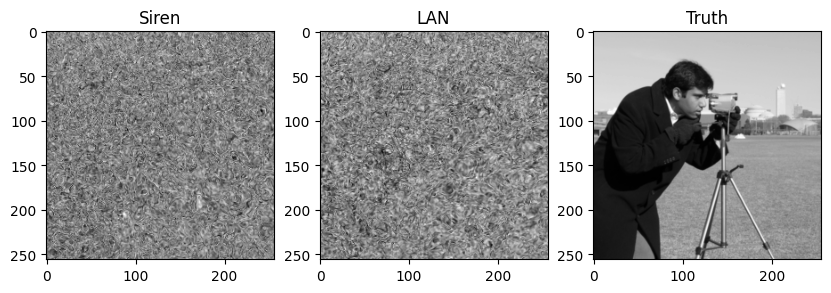

Step 100, Siren loss 0.456871
Step 100, LAN loss 0.457107


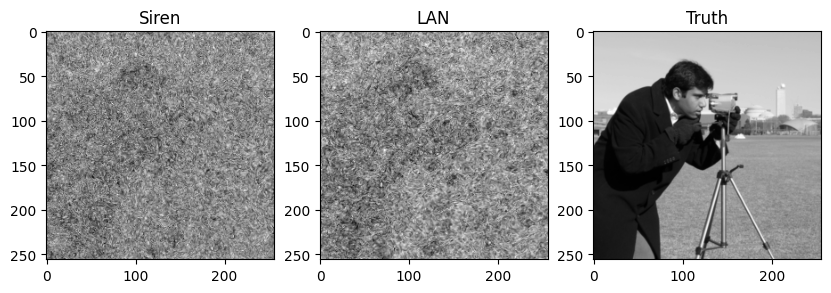

Step 150, Siren loss 0.226240
Step 150, LAN loss 0.210118


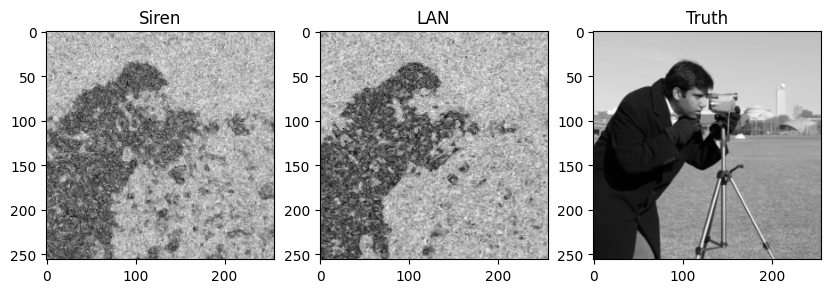

Step 200, Siren loss 0.100275
Step 200, LAN loss 0.130389


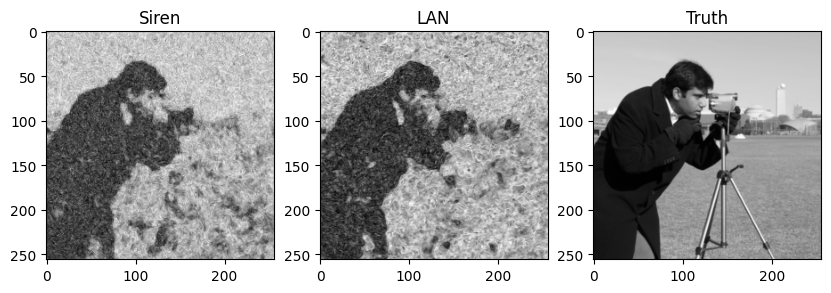

Step 250, Siren loss 0.059795
Step 250, LAN loss 0.164015


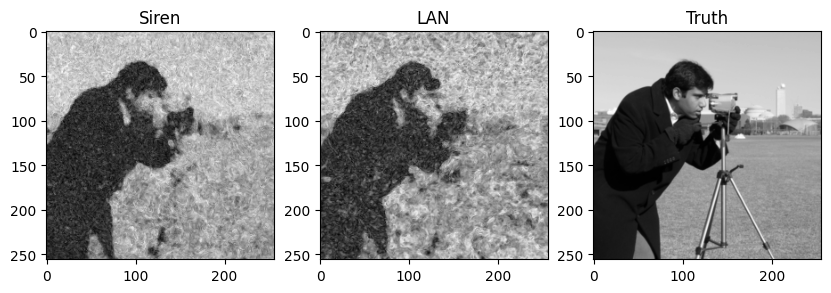

Step 300, Siren loss 0.031705
Step 300, LAN loss 0.046648


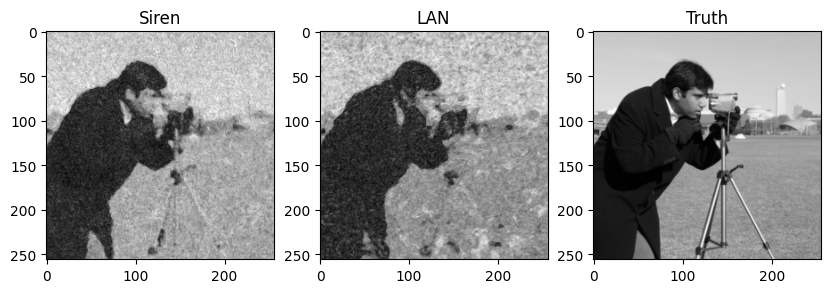

Step 350, Siren loss 0.018399
Step 350, LAN loss 0.023424


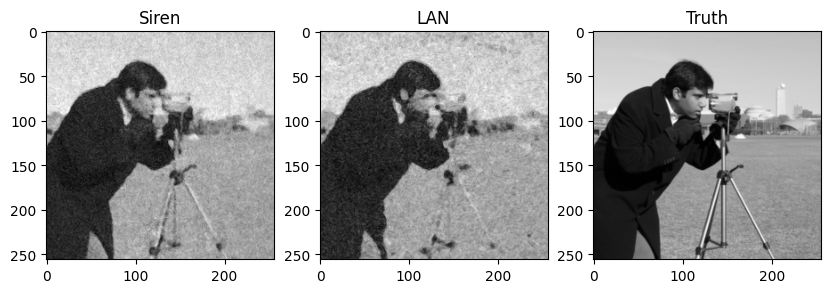

Step 400, Siren loss 0.013620
Step 400, LAN loss 0.018839


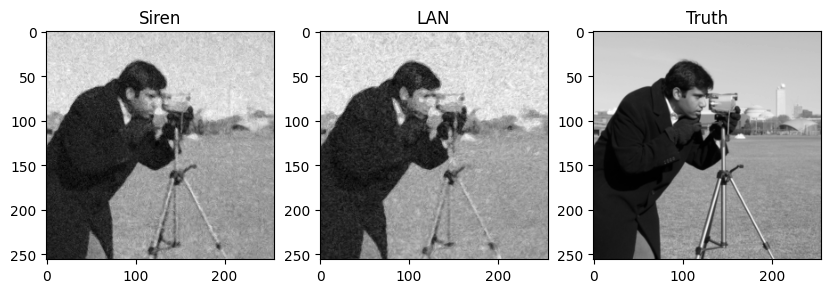

Step 450, Siren loss 0.003601
Step 450, LAN loss 0.008190


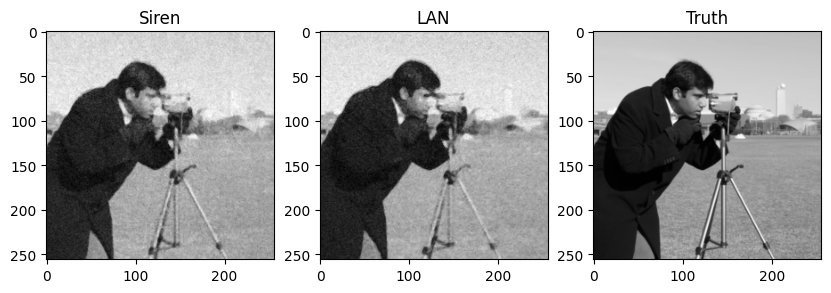

Step 500, Siren loss 0.007327
Step 500, LAN loss 0.005996


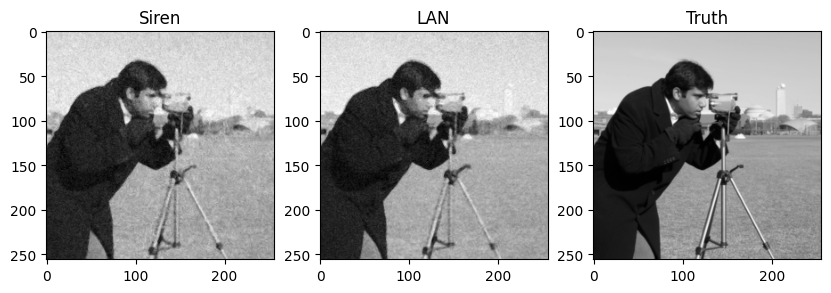

Step 550, Siren loss 0.017067
Step 550, LAN loss 0.018809


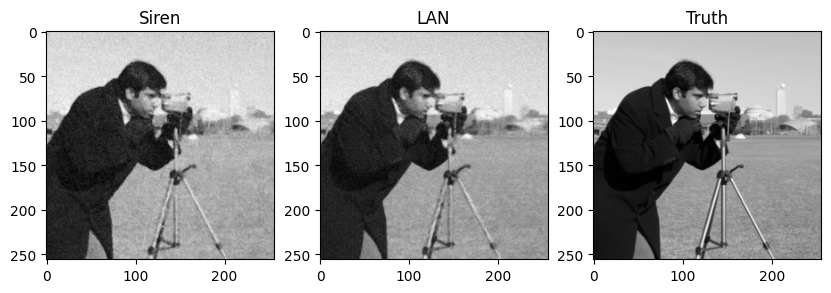

Step 600, Siren loss 0.015589
Step 600, LAN loss 0.010571


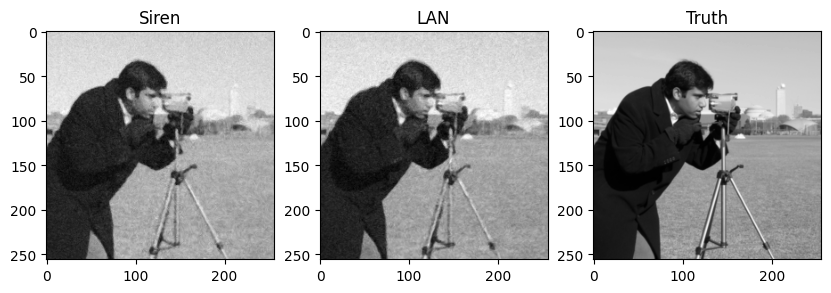

Step 650, Siren loss 0.009312
Step 650, LAN loss 0.007522


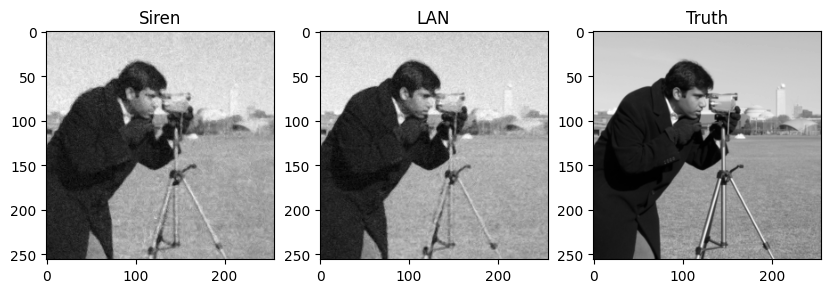

Step 700, Siren loss 0.014135
Step 700, LAN loss 0.012033


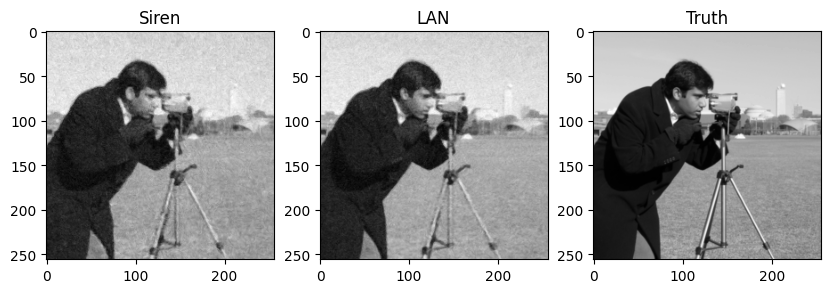

Step 750, Siren loss 0.013659
Step 750, LAN loss 0.014317


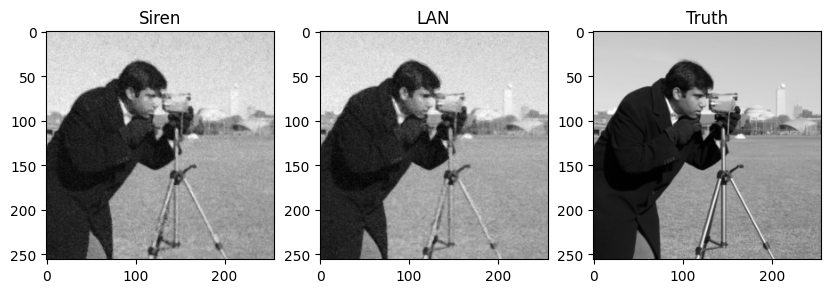

Step 800, Siren loss 0.009012
Step 800, LAN loss 0.010015


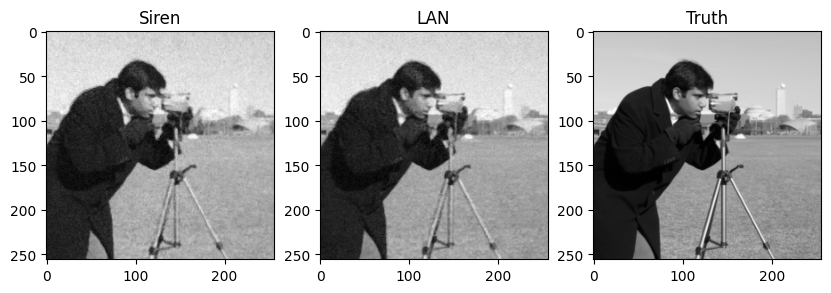

Step 850, Siren loss 0.002868
Step 850, LAN loss 0.002255


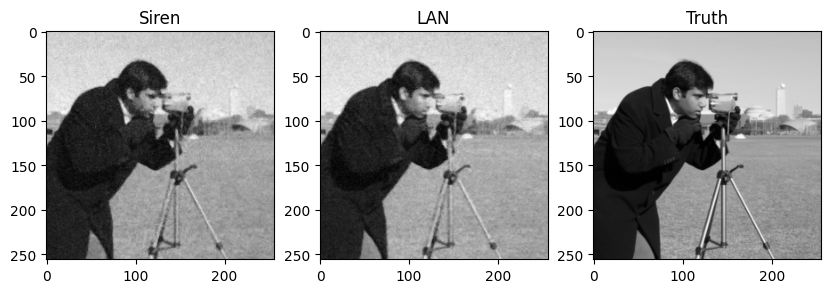

Step 900, Siren loss 0.006714
Step 900, LAN loss 0.005220


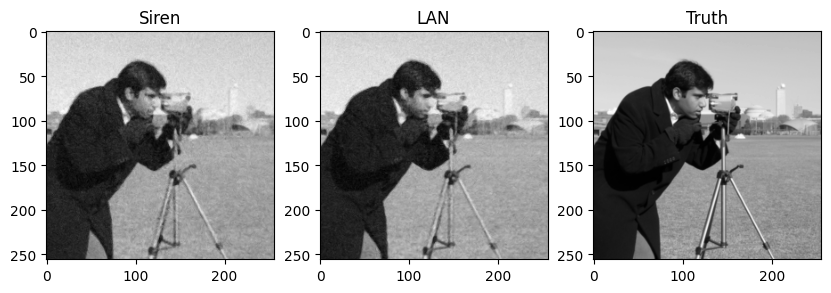

Step 950, Siren loss 0.025720
Step 950, LAN loss 0.023137


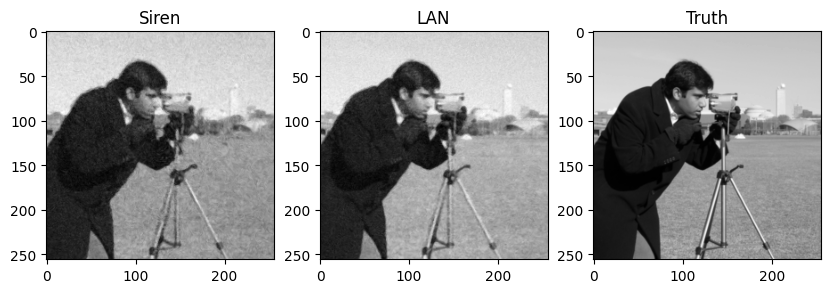

Step 1000, Siren loss 0.015639
Step 1000, LAN loss 0.015028


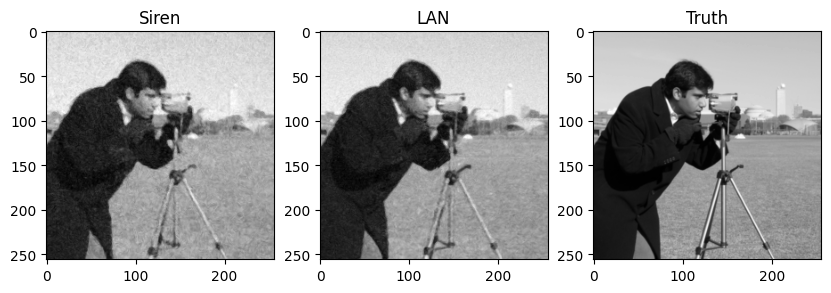

Step 1050, Siren loss 0.010294
Step 1050, LAN loss 0.009087


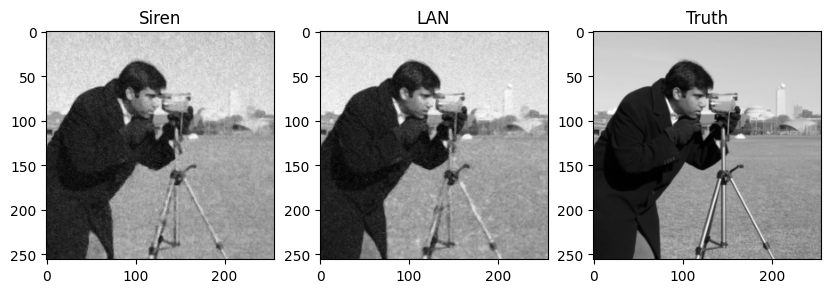

Step 1100, Siren loss 0.011443
Step 1100, LAN loss 0.010143


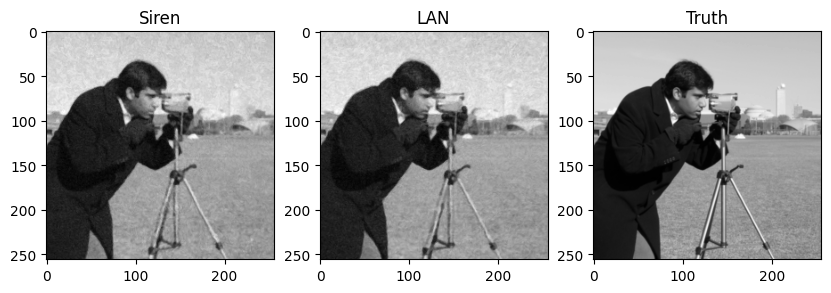

Step 1150, Siren loss 0.011600
Step 1150, LAN loss 0.015428


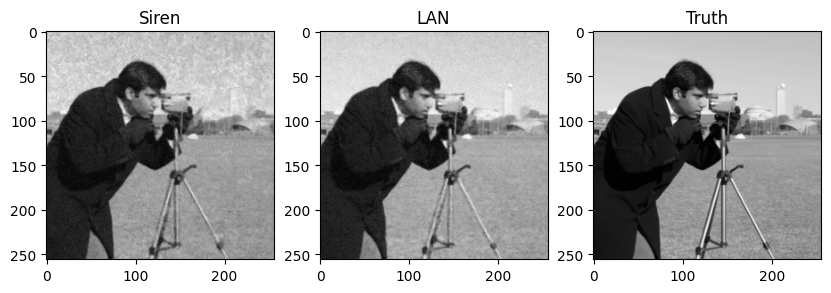

Step 1200, Siren loss 0.008895
Step 1200, LAN loss 0.008098


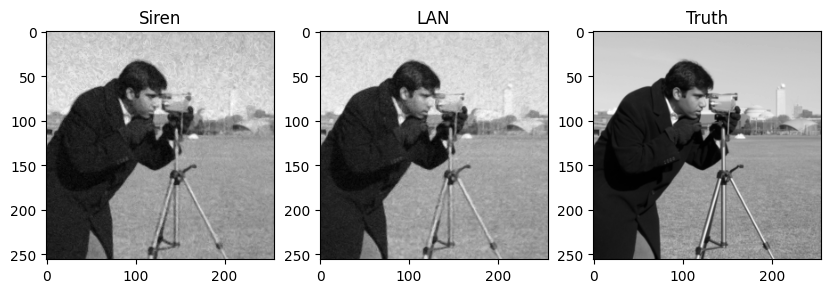

Step 1250, Siren loss 0.014599
Step 1250, LAN loss 0.003042


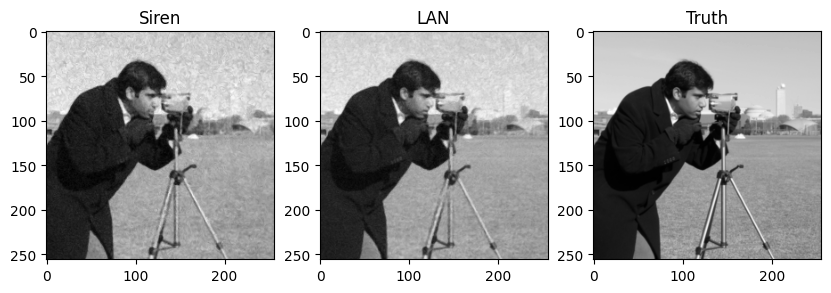

Step 1300, Siren loss 0.004422
Step 1300, LAN loss 0.006366


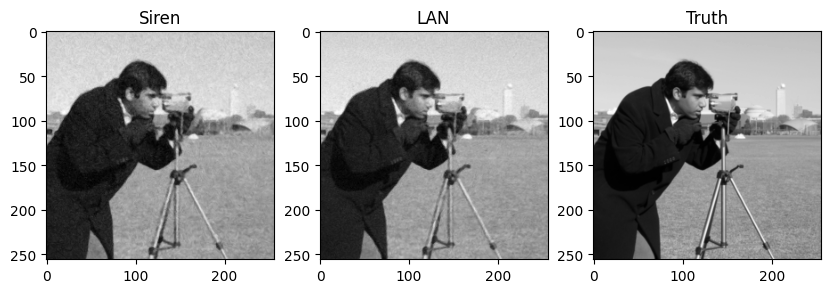

Step 1350, Siren loss 0.008953
Step 1350, LAN loss 0.010326


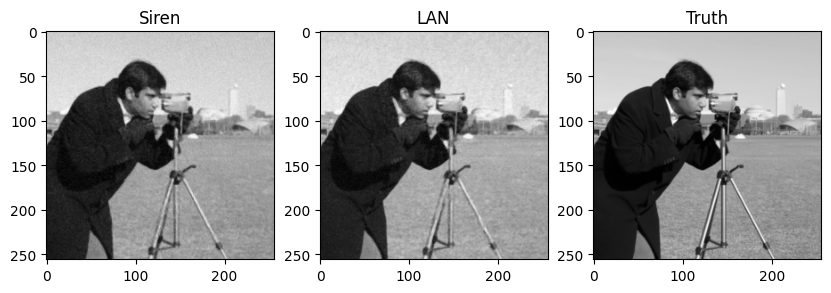

Step 1400, Siren loss 0.004031
Step 1400, LAN loss 0.006255


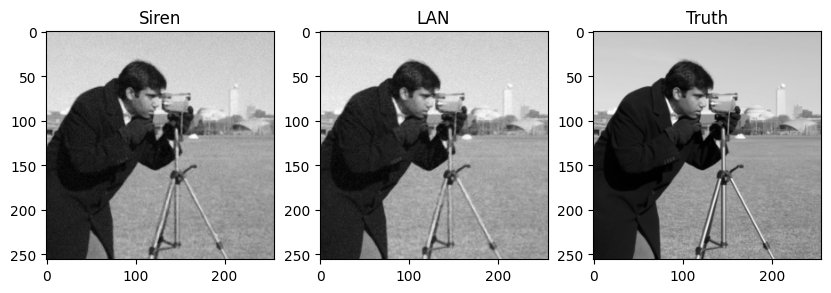

Step 1450, Siren loss 0.007500
Step 1450, LAN loss 0.003566


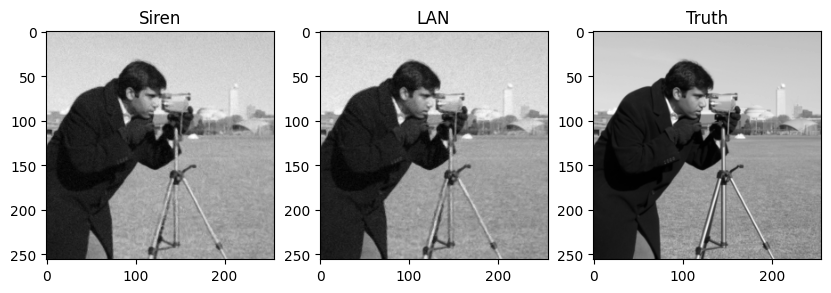

Step 1500, Siren loss 0.008386
Step 1500, LAN loss 0.010614


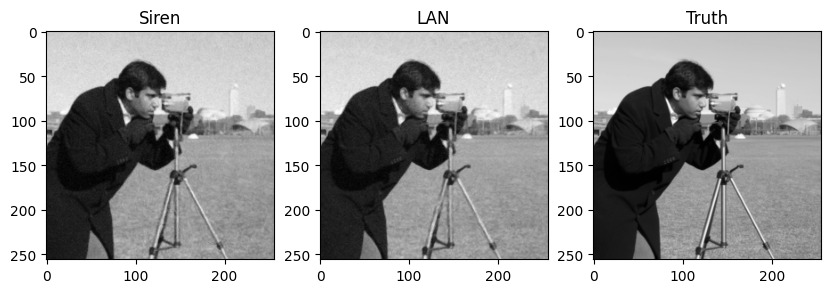

Step 1550, Siren loss 0.010592
Step 1550, LAN loss 0.006655


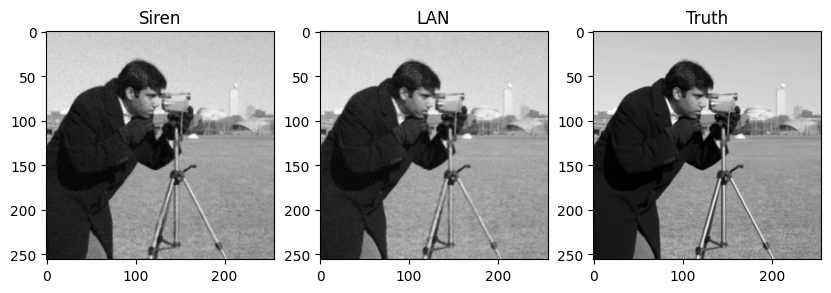

Step 1600, Siren loss 0.004394
Step 1600, LAN loss 0.006574


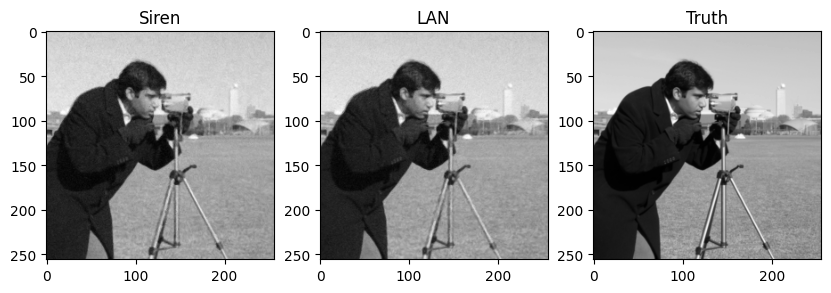

Step 1650, Siren loss 0.001174
Step 1650, LAN loss 0.002123


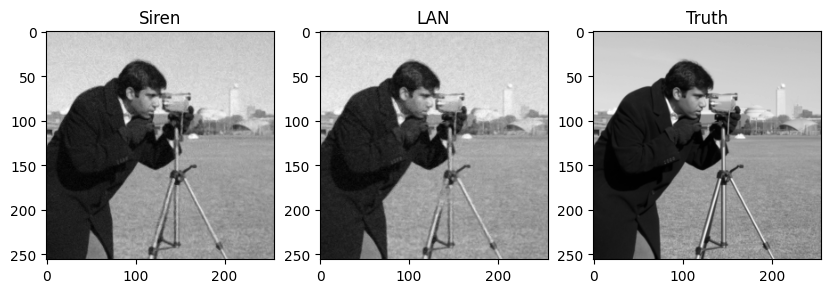

Step 1700, Siren loss 0.002262
Step 1700, LAN loss 0.001842


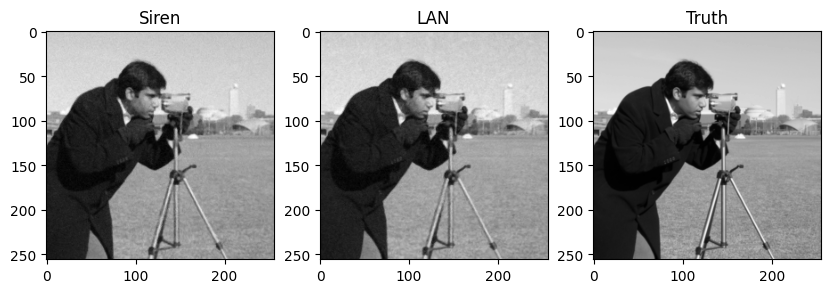

Step 1750, Siren loss 0.004869
Step 1750, LAN loss 0.011657


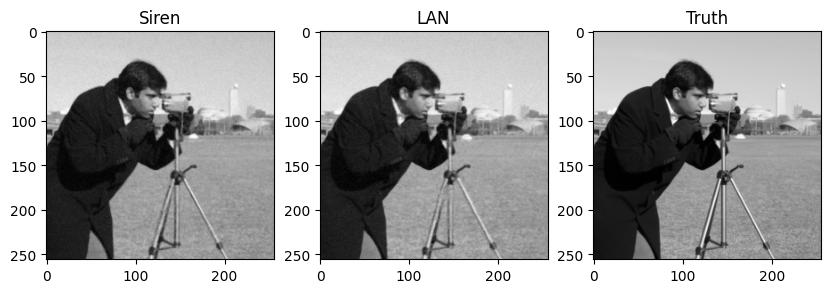

Step 1800, Siren loss 0.005029
Step 1800, LAN loss 0.005654


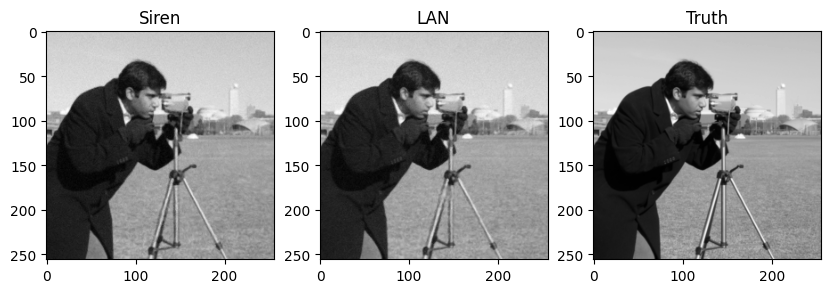

Step 1850, Siren loss 0.003324
Step 1850, LAN loss 0.003107


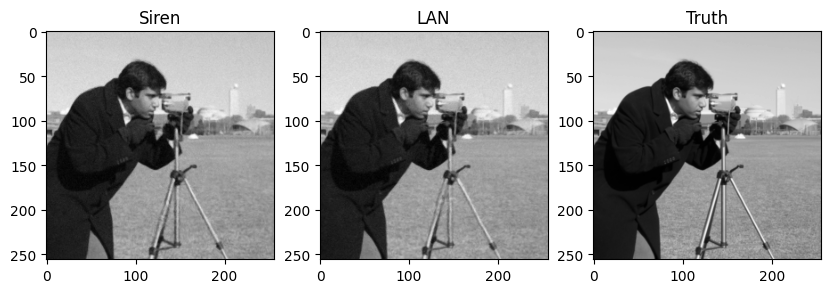

Step 1900, Siren loss 0.010714
Step 1900, LAN loss 0.008923


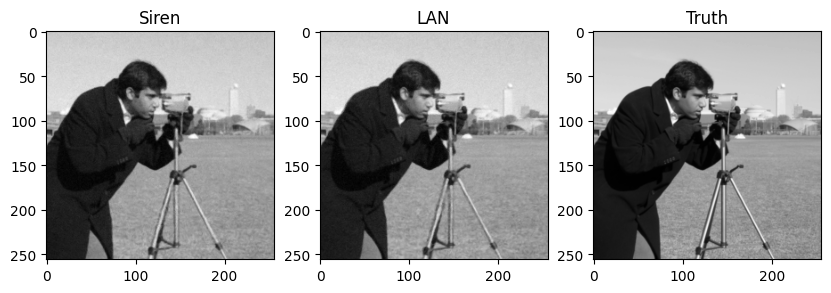

Step 1950, Siren loss 0.007551
Step 1950, LAN loss 0.010111


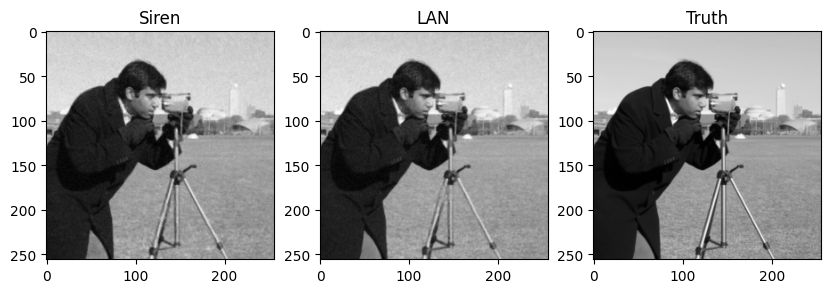

Step 2000, Siren loss 0.003816
Step 2000, LAN loss 0.006322


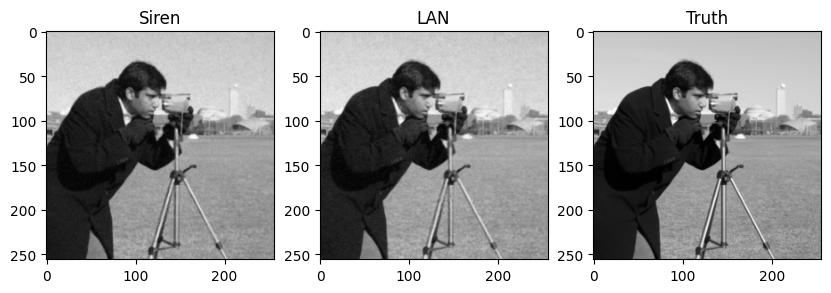

Step 2050, Siren loss 0.001397
Step 2050, LAN loss 0.000573


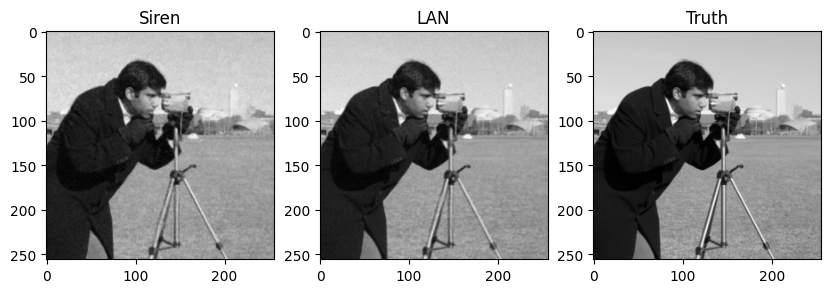

Step 2100, Siren loss 0.002472
Step 2100, LAN loss 0.002300


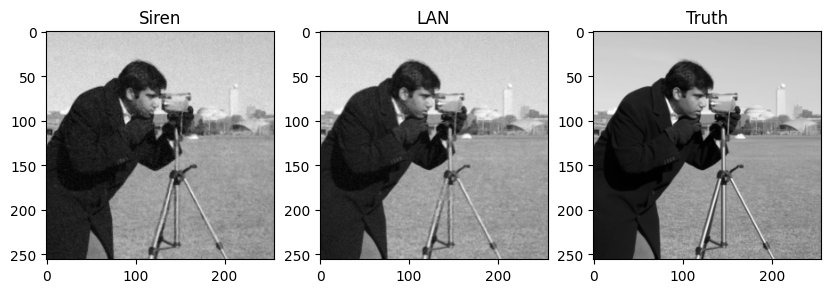

Step 2150, Siren loss 0.007813
Step 2150, LAN loss 0.009116


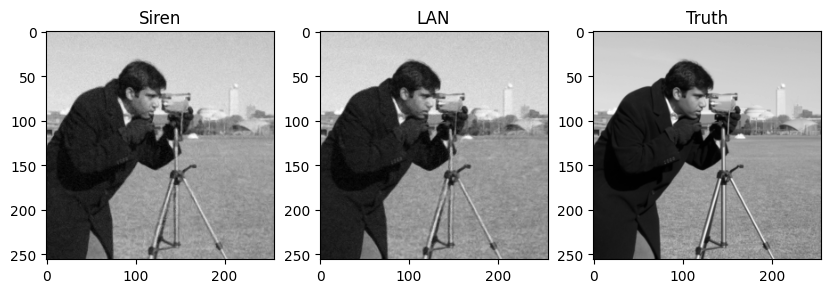

Step 2200, Siren loss 0.002714
Step 2200, LAN loss 0.006763


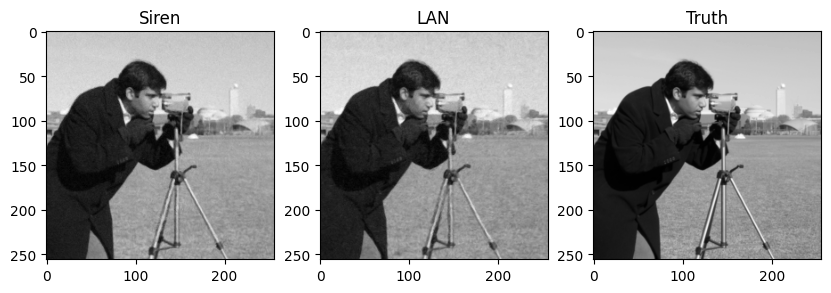

Step 2250, Siren loss 0.004226
Step 2250, LAN loss 0.004293


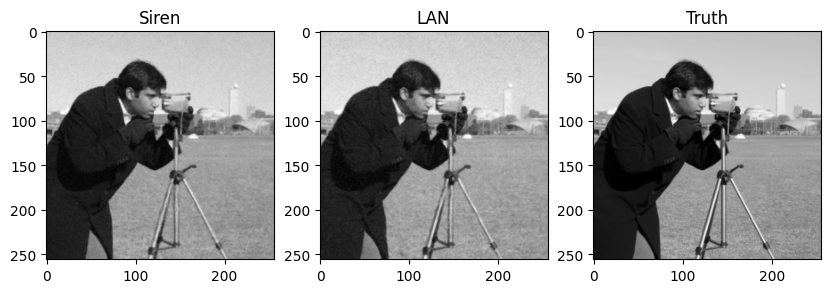

Step 2300, Siren loss 0.008448
Step 2300, LAN loss 0.009765


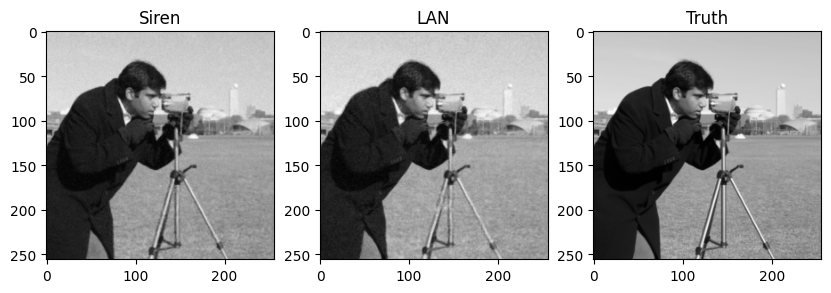

Step 2350, Siren loss 0.008696
Step 2350, LAN loss 0.012579


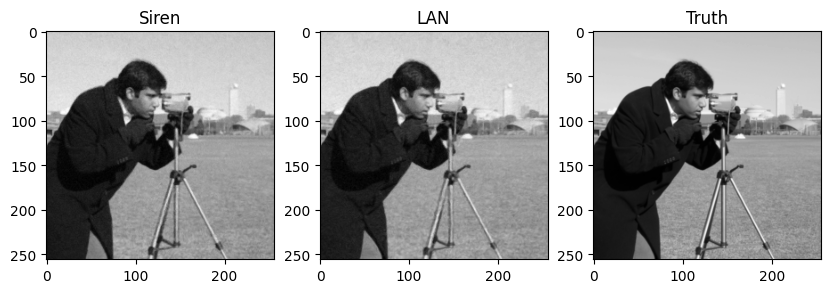

Step 2400, Siren loss 0.003969
Step 2400, LAN loss 0.005244


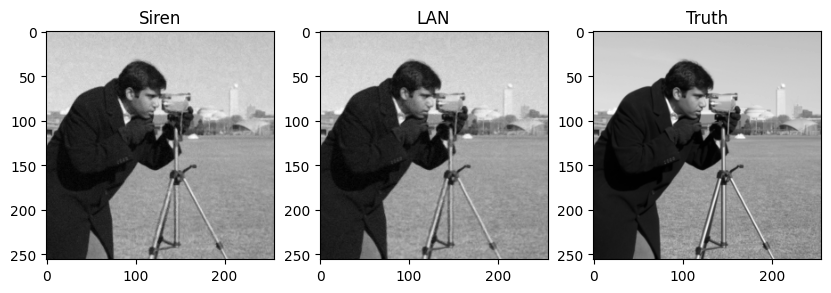

Step 2450, Siren loss 0.001181
Step 2450, LAN loss 0.000888


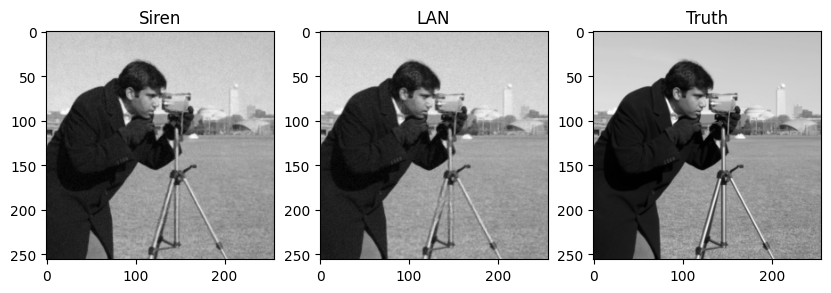

Step 2500, Siren loss 0.002783
Step 2500, LAN loss 0.001033


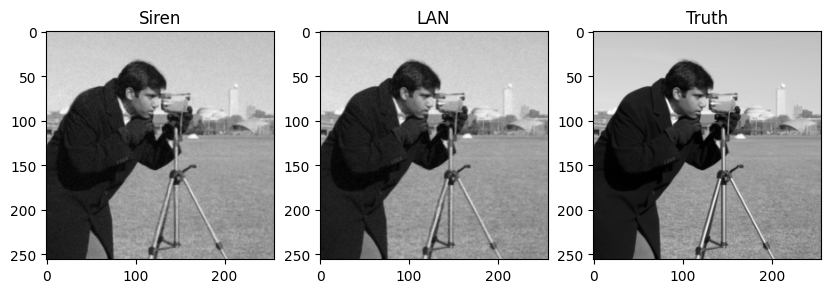

Step 2550, Siren loss 0.007392
Step 2550, LAN loss 0.010834


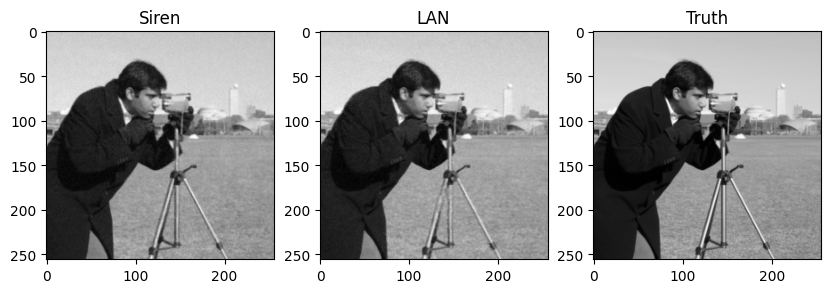

Step 2600, Siren loss 0.004466
Step 2600, LAN loss 0.005158


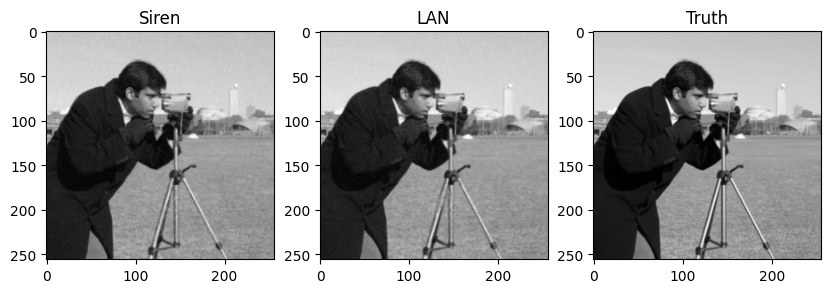

Step 2650, Siren loss 0.004309
Step 2650, LAN loss 0.003749


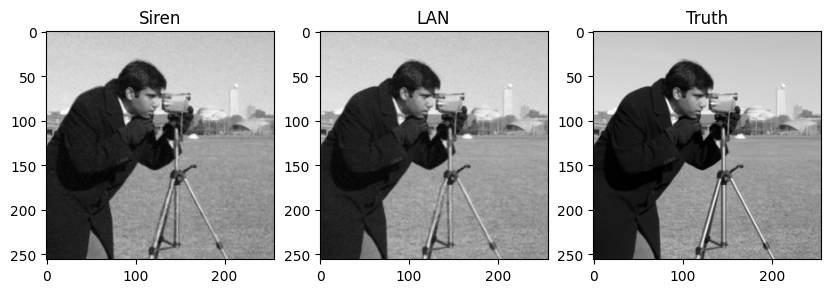

Step 2700, Siren loss 0.008324
Step 2700, LAN loss 0.006875


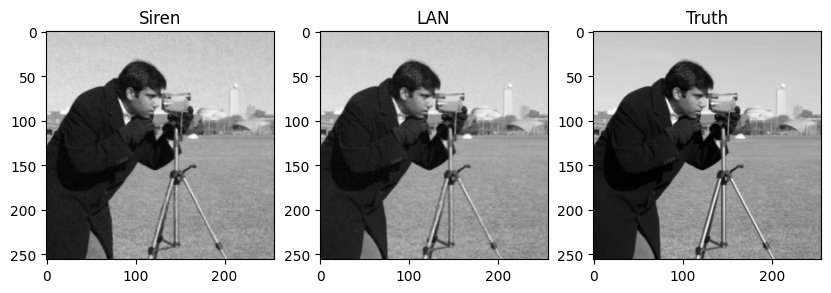

Step 2750, Siren loss 0.008226
Step 2750, LAN loss 0.007240


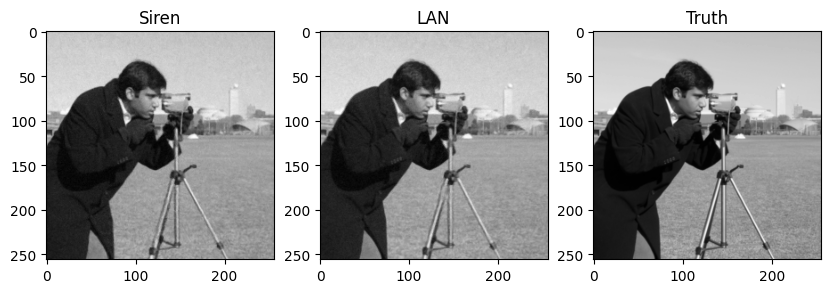

Step 2800, Siren loss 0.005493
Step 2800, LAN loss 0.003395


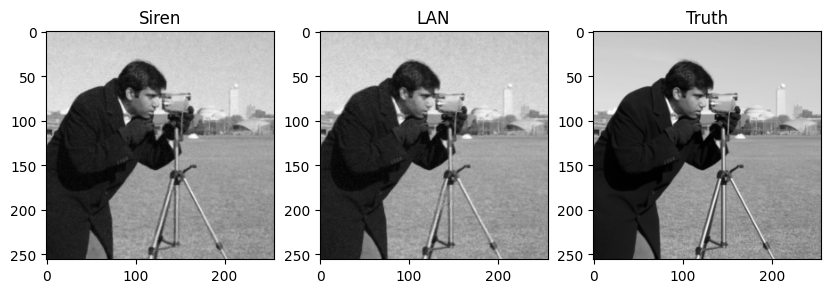

Step 2850, Siren loss 0.000708
Step 2850, LAN loss 0.001102


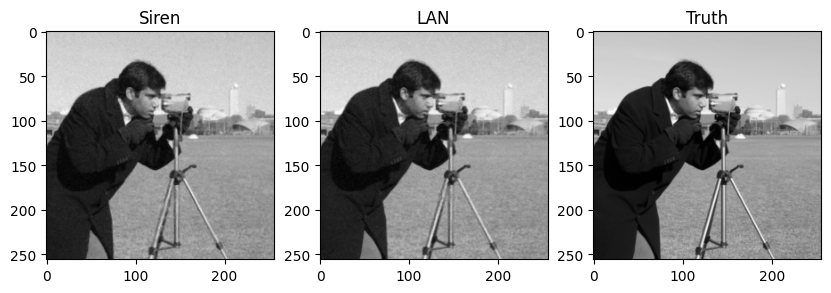

Step 2900, Siren loss 0.002444
Step 2900, LAN loss 0.001040


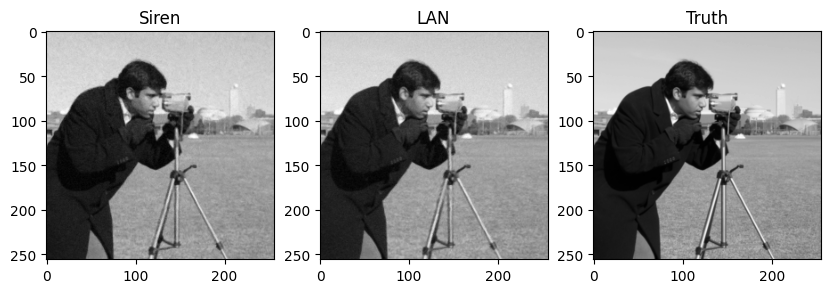

Step 2950, Siren loss 0.005784
Step 2950, LAN loss 0.009493


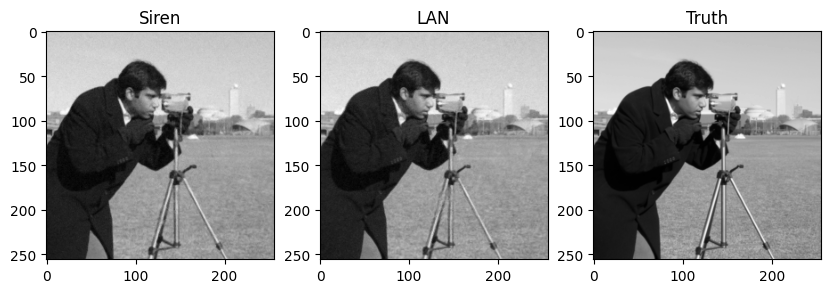

Step 3000, Siren loss 0.003448
Step 3000, LAN loss 0.006084


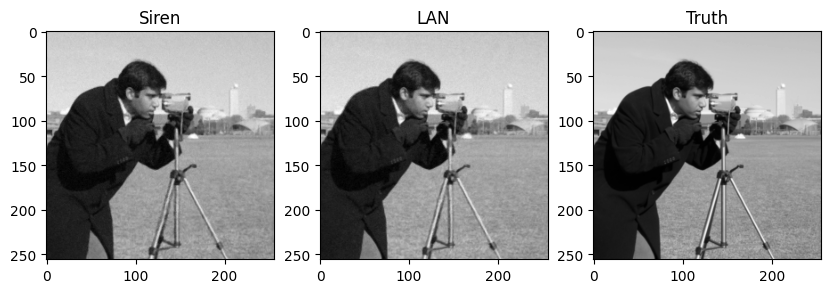

Step 3050, Siren loss 0.005620
Step 3050, LAN loss 0.004872


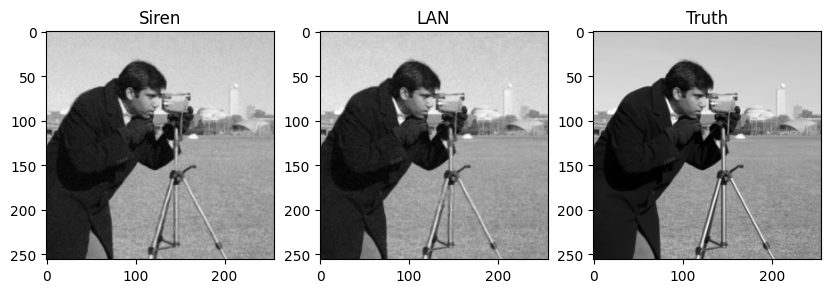

Step 3100, Siren loss 0.008761
Step 3100, LAN loss 0.007621


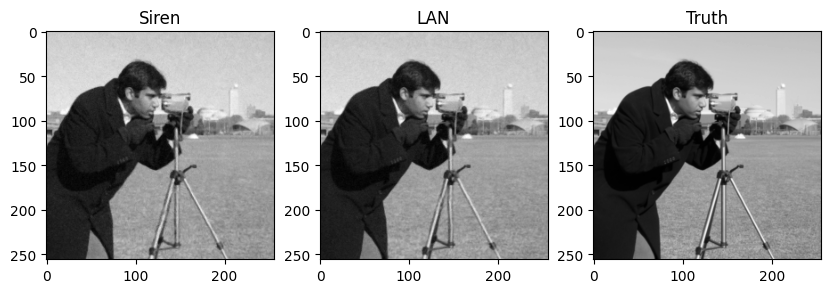

Step 3150, Siren loss 0.006370
Step 3150, LAN loss 0.008349


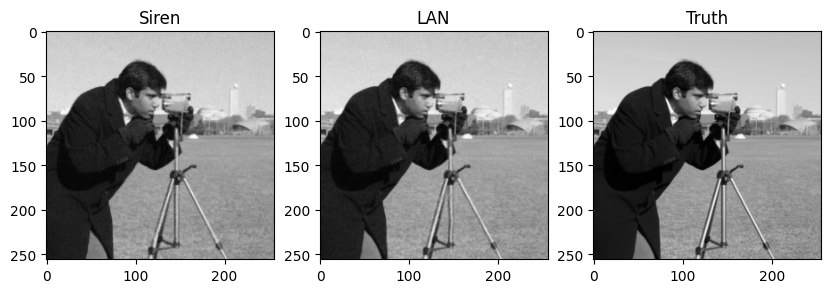

Step 3200, Siren loss 0.003193
Step 3200, LAN loss 0.005089


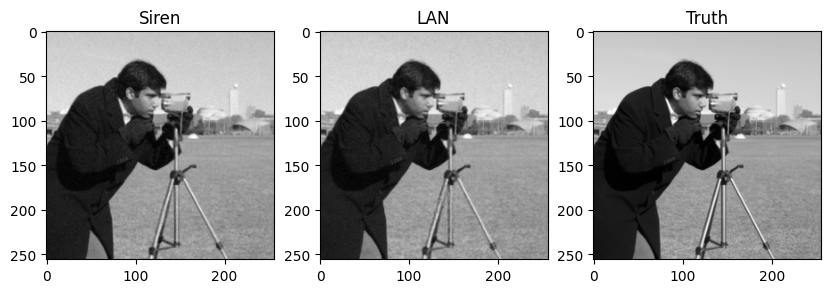

Step 3250, Siren loss 0.001053
Step 3250, LAN loss 0.000708


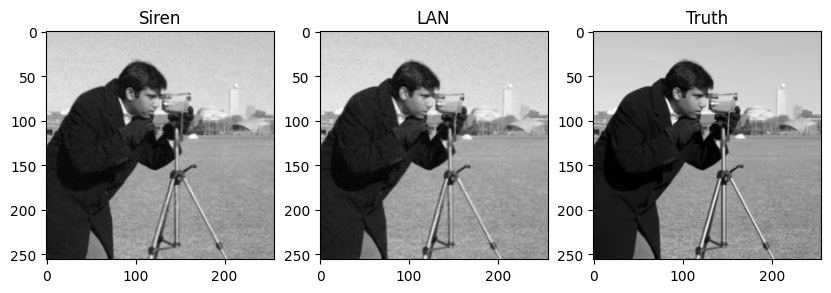

Step 3300, Siren loss 0.001231
Step 3300, LAN loss 0.001814


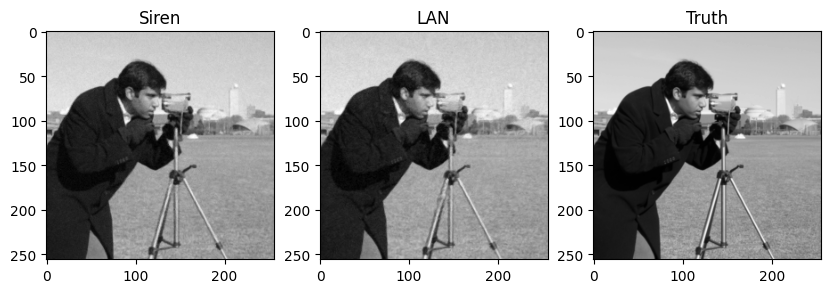

Step 3350, Siren loss 0.004920
Step 3350, LAN loss 0.009100


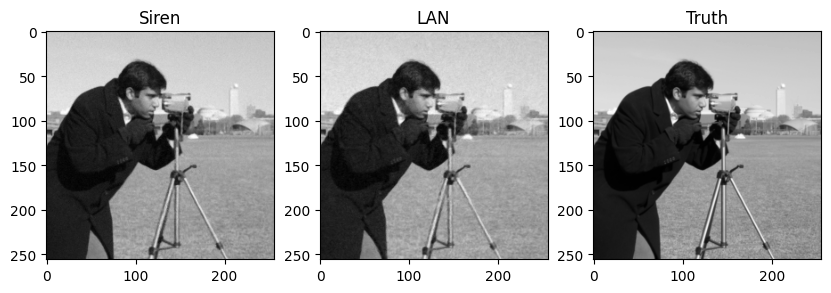

Step 3400, Siren loss 0.005348
Step 3400, LAN loss 0.004958


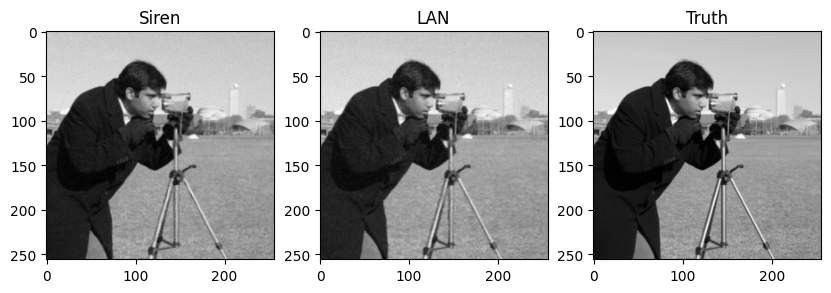

Step 3450, Siren loss 0.003279
Step 3450, LAN loss 0.004649


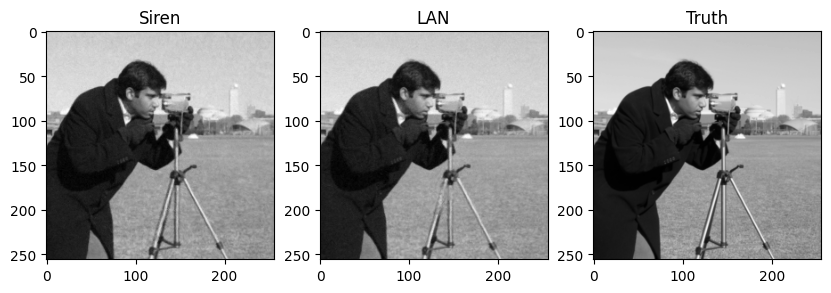

Step 3500, Siren loss 0.006279
Step 3500, LAN loss 0.008203


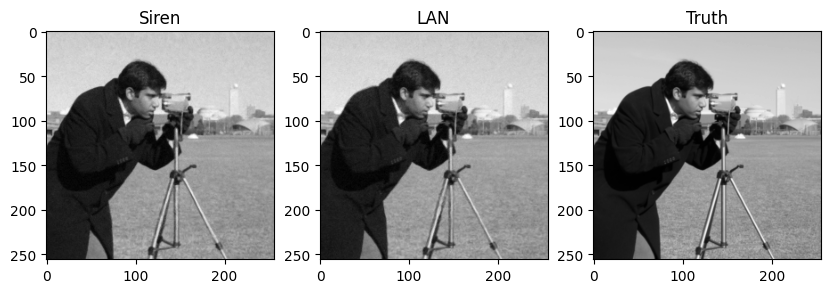

Step 3550, Siren loss 0.007781
Step 3550, LAN loss 0.010069


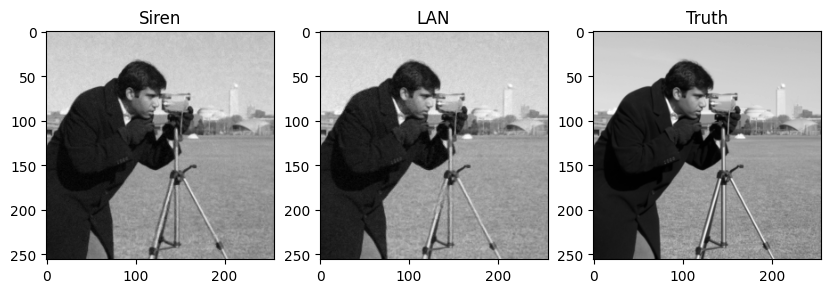

Step 3600, Siren loss 0.004739
Step 3600, LAN loss 0.006594


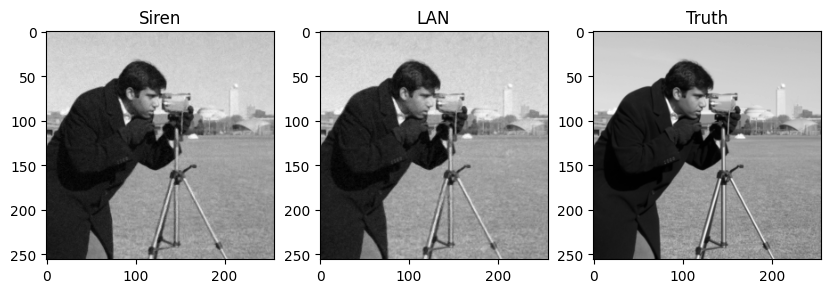

Step 3650, Siren loss 0.000659
Step 3650, LAN loss 0.000619


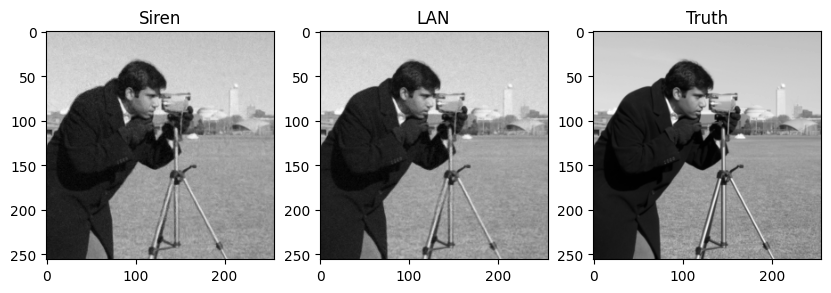

Step 3700, Siren loss 0.001599
Step 3700, LAN loss 0.001949


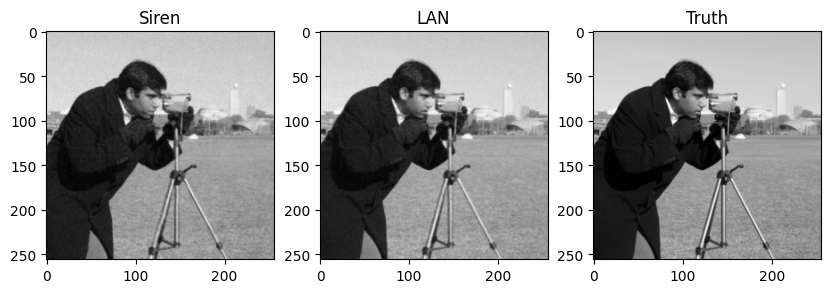

Step 3750, Siren loss 0.007335
Step 3750, LAN loss 0.007187


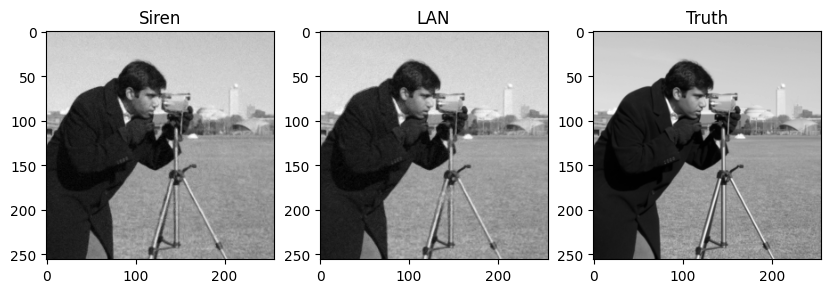

Step 3800, Siren loss 0.007774
Step 3800, LAN loss 0.004713


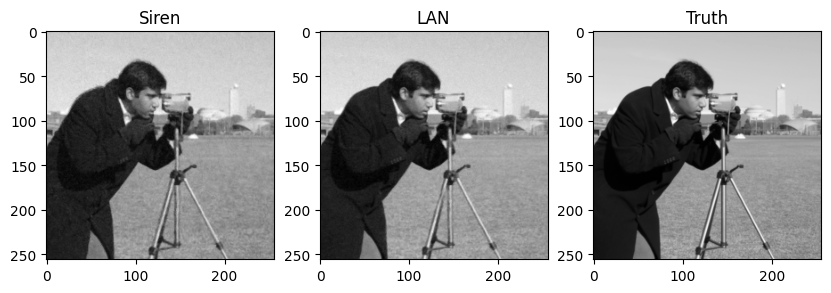

Step 3850, Siren loss 0.005366
Step 3850, LAN loss 0.003043


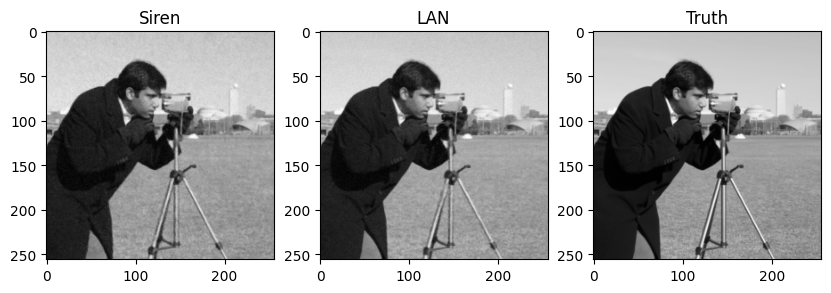

Step 3900, Siren loss 0.008746
Step 3900, LAN loss 0.008775


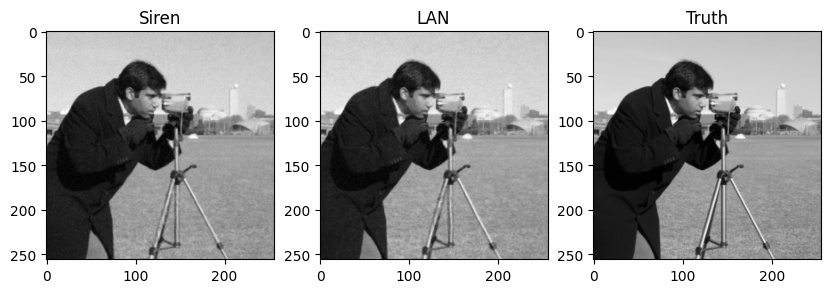

Step 3950, Siren loss 0.006133
Step 3950, LAN loss 0.007236


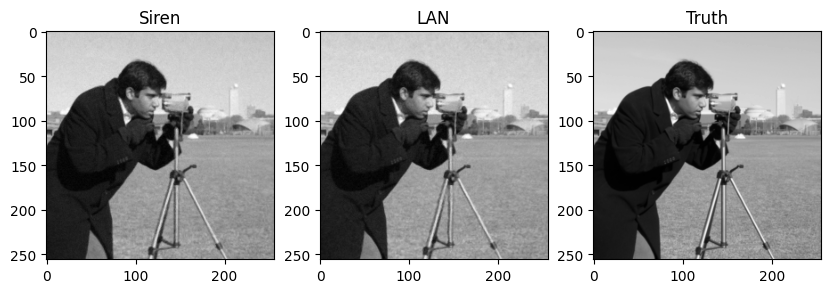

Step 4000, Siren loss 0.004428
Step 4000, LAN loss 0.004433


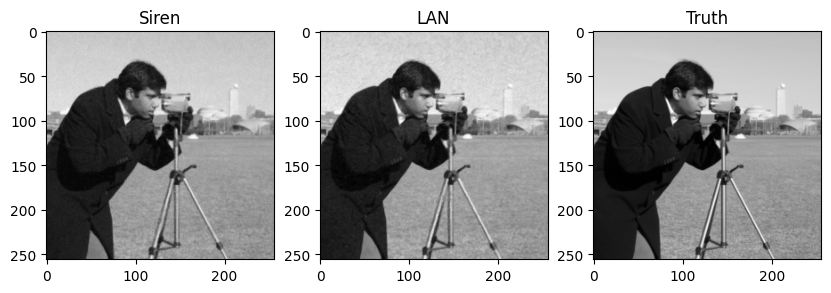

In [17]:
torch.manual_seed(SEED)
np.random.seed(SEED)

total_steps = 4000 # Since the whole image is our dataset, this just means 500 gradient descent steps.
switch = 1000
steps_til_summary = 50
early = True
siren_optim = torch.optim.Adam(lr=1e-3, params=img_siren.parameters())
lan_optim = torch.optim.Adam(lr=1e-3, params=img_lan.parameters())

# model_input, ground_truth = next(iter(dataloader))
# model_input, ground_truth = model_input[0].to(device), ground_truth.to(device)

# model_input = model_input


batch_size_infer = 4096
img = get_cameraman_tensor(sidelength)
global_pixels = img.permute(1, 2, 0).view(-1, 1)
global_image_coors = get_mgrid(sidelength, 2)
batched_image = global_image_to_batch(global_image_coors, batch_size_infer)

step = 0

psnr = {
    'Siren': [],
    'LAN': []
}

while step < total_steps:
    for local_step, [model_input, ground_truth] in enumerate(dataloader):
        if step >= switch and early:
            siren_optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())
            lan_optim = torch.optim.Adam(lr=1e-4, params=img_lan.parameters())
            early = False

        img_siren.train()
        img_lan.train()


        model_input, ground_truth = model_input.to(device), ground_truth.to(device)

    #     model_output, coords = img_siren(model_input)
        siren_output = img_siren(model_input)
        lan_output = img_lan(model_input)

        siren_loss = ((siren_output - ground_truth)**2).mean()
        lan_loss = ((lan_output - ground_truth)**2).mean()

        siren_optim.zero_grad()
        siren_loss.backward()
        siren_optim.step()

        lan_optim.zero_grad()
        lan_loss.backward()
        lan_optim.step()   
        
        step += 1     
        
        if not step % steps_til_summary:
            img_siren.eval()
            img_lan.eval()
            print("Step %d, Siren loss %0.6f" % (step, siren_loss))
            print("Step %d, LAN loss %0.6f" % (step, lan_loss))

            lan_global_output = []
            siren_global_output = []
            
            for batch in batched_image:
                batch = batch.to(device)

                lan_batched_output = img_lan(batch)
                siren_batched_output = img_siren(batch)

                lan_global_output.append(lan_batched_output.cpu().detach())
                siren_global_output.append(siren_batched_output.cpu().detach())



            lan_global_output = torch.stack(lan_global_output)
            siren_global_output = torch.stack(siren_global_output)    

            
            psnr['Siren'].append(get_psnr(siren_global_output, global_pixels))
            psnr['LAN'].append(get_psnr(lan_global_output, global_pixels))

            fig, axes = plt.subplots(1, 3, figsize=(10,10))

            axes[0].imshow(siren_global_output.view(sidelength, sidelength).numpy(), cmap='gray')
            axes[0].set_title('Siren')
            axes[1].imshow(lan_global_output.view(sidelength, sidelength).numpy(), cmap='gray')
            axes[1].set_title('LAN')
            axes[2].imshow(global_pixels.view(sidelength,sidelength).numpy(), cmap='gray')
            axes[2].set_title('Truth')

            plt.show()

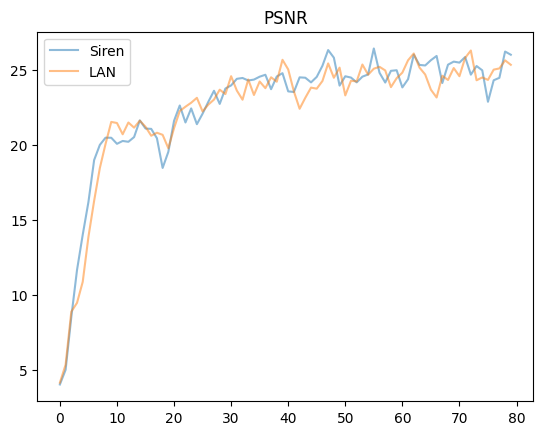

In [18]:
plot_loss(psnr, 'PSNR')

## Fitting an audio signal
<a id='section_2'></a>

Here, we'll use Siren to parameterize an audio signal - i.e., we seek to parameterize an audio waverform $f(t)$  at time points $t$ by a SIREN $\Phi$.

That is we seek the function $\Phi$ such that:  $\mathcal{L}\int_\Omega \lVert \Phi(t) - f(t) \rVert \mathrm{d}t$  is minimized, in which  $\Omega$  is the domain of the waveform.

For the audio, we'll use the bach sonata:

In [19]:
import os
import scipy.io.wavfile as wavfile
import io
from IPython.display import Audio

if not os.path.exists('gt_bach.wav'):
    !wget https://vsitzmann.github.io/siren/img/audio/gt_bach.wav

In [20]:
class AudioFile(torch.utils.data.Dataset):
    def __init__(self, filename):
        self.rate, self.data = wavfile.read(filename)
        self.data = self.data.astype(np.float32)
        self.timepoints = get_mgrid(len(self.data), 1)
        self.scale = np.max(np.abs(self.data))
        self.amplitude = torch.Tensor(self.data/self.scale).view(-1, 1)
        

    def get_num_samples(self):
        return self.timepoints.shape[0]

    def __len__(self):
        return self.timepoints.size(0)

    def __getitem__(self, idx):
        return self.timepoints[idx], self.amplitude[idx]
    
# class AudioFile(torch.utils.data.Dataset):
#     def __init__(self, filename):
#         self.rate, self.data = wavfile.read(filename)
#         self.data = self.data.astype(np.float32)
#         self.timepoints = get_mgrid(len(self.data), 1)

#     def get_num_samples(self):
#         return self.timepoints.shape[0]

#     def __len__(self):
#         return 1

#     def __getitem__(self, idx):
#         amplitude = self.data
#         scale = np.max(np.abs(amplitude))
#         amplitude = (amplitude / scale)
#         amplitude = torch.Tensor(amplitude).view(-1, 1)
#         return self.timepoints, amplitude

In [21]:
bach_audio = AudioFile('gt_bach.wav')

# bach_audio.__getitem__(0)[0].size(0)

bach_audio.__len__()

/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


308207

In [22]:
SEED = 42
# batch_size = bach_audio.__len__()
batch_size = 4096*4
print(batch_size)
torch.manual_seed(SEED)
np.random.seed(SEED)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
hidden_features = 128
print(device)
in_features=1
out_features=1

# (self, in_features, out_features, hidden_features, first_w0=30, w0=30, device = 'cpu', num = 5, grid_range= [-1, 1]):


bach_audio = AudioFile('gt_bach.wav')
dataloader = DataLoader(bach_audio, shuffle=False, batch_size=batch_size, pin_memory=True, num_workers=0, drop_last=False)
# Note that we increase the frequency of the first layer to match the higher frequencies of the
# audio signal. Equivalently, we could also increase the range of the input coordinates.
audio_siren = Siren(in_features=in_features, out_features=out_features, hidden_features=hidden_features, device = device, first_w0=3000)
audio_lan = LAN(in_features=in_features, out_features=out_features, hidden_features=hidden_features, device = device, first_w0=3000)

# audio_siren.cuda()

16384
cuda


In [23]:
rate, _ = wavfile.read('gt_bach.wav')

# model_input, ground_truth = next(iter(dataloader))
# Audio(ground_truth.squeeze().numpy(),rate=rate)

Step 0, Siren loss 0.009855
Step 0, LAN loss 0.013911


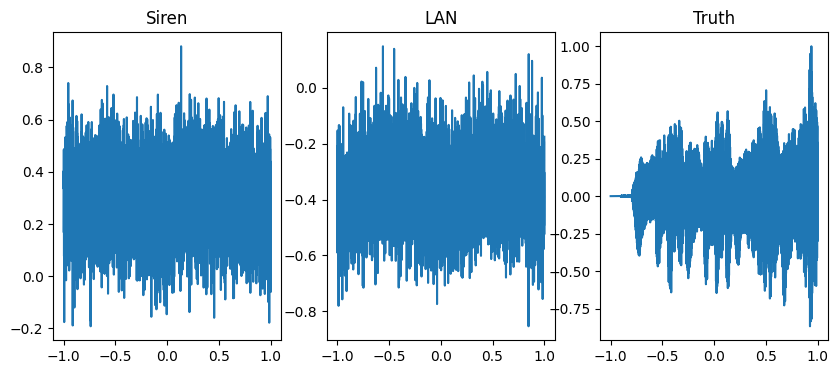

Step 100, Siren loss 0.029402
Step 100, LAN loss 0.031030


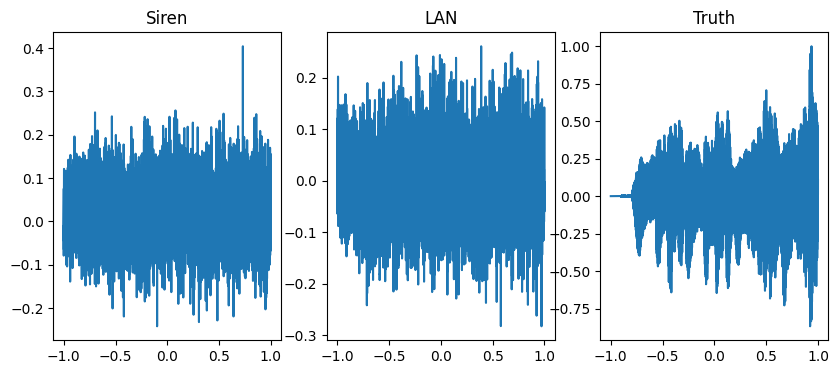

Step 200, Siren loss 0.033504
Step 200, LAN loss 0.033694


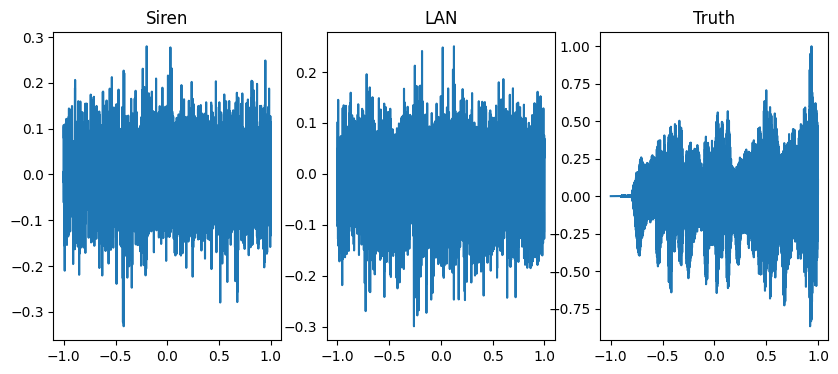

Step 300, Siren loss 0.028438
Step 300, LAN loss 0.035276


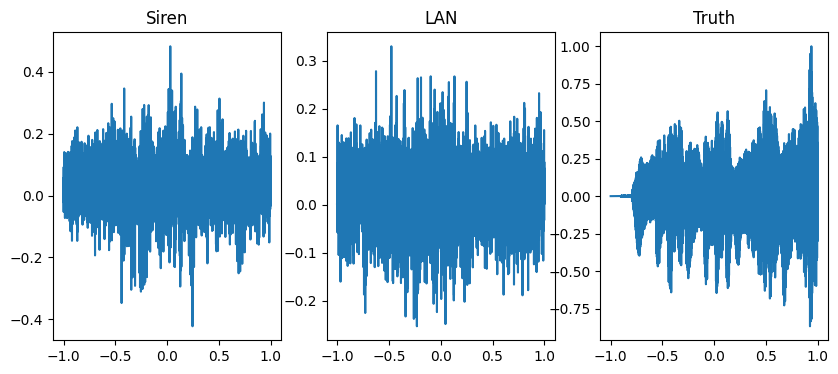

Step 400, Siren loss 0.003337
Step 400, LAN loss 0.003853


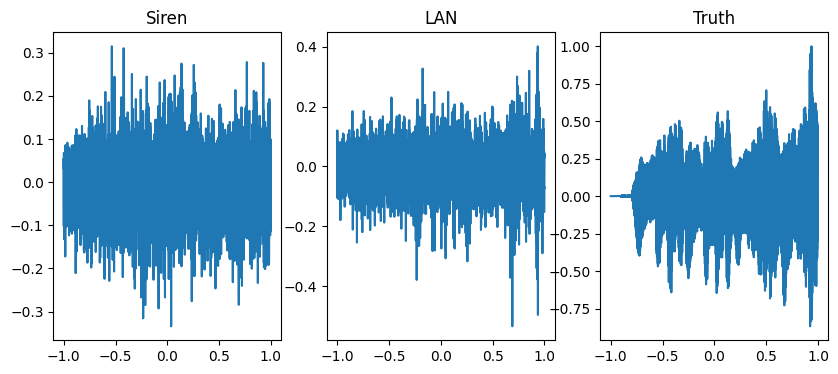

Step 500, Siren loss 0.020142
Step 500, LAN loss 0.022427


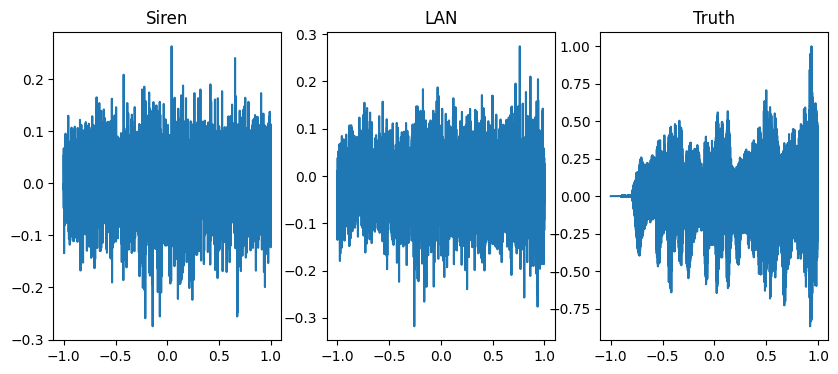

Step 600, Siren loss 0.013046
Step 600, LAN loss 0.012316


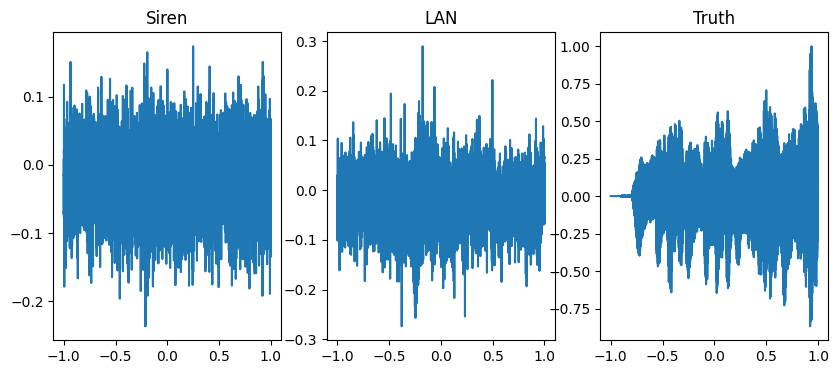

Step 700, Siren loss 0.025746
Step 700, LAN loss 0.023230


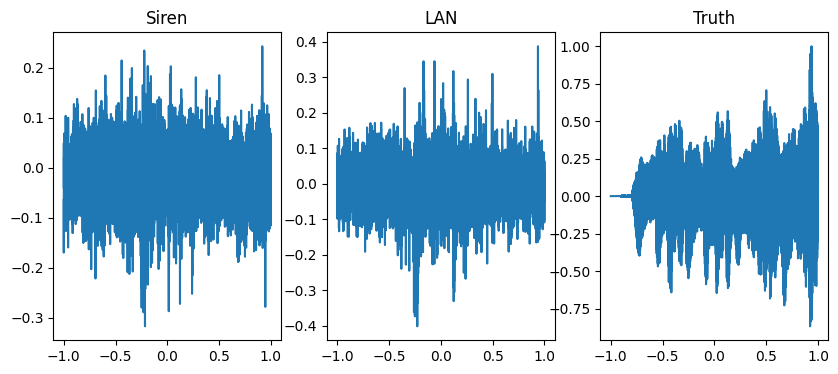

Step 800, Siren loss 0.012333
Step 800, LAN loss 0.011871


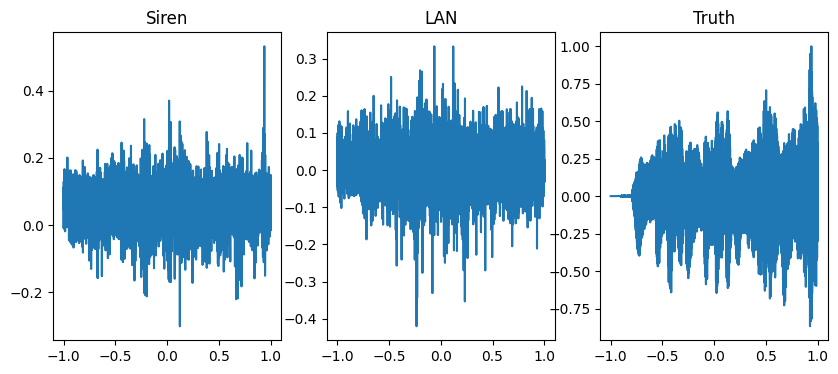

Step 900, Siren loss 0.013129
Step 900, LAN loss 0.019530


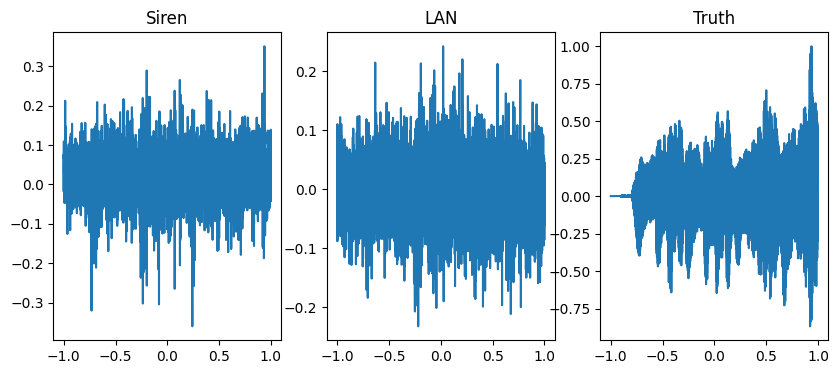

Step 1000, Siren loss 0.014419
Step 1000, LAN loss 0.015579


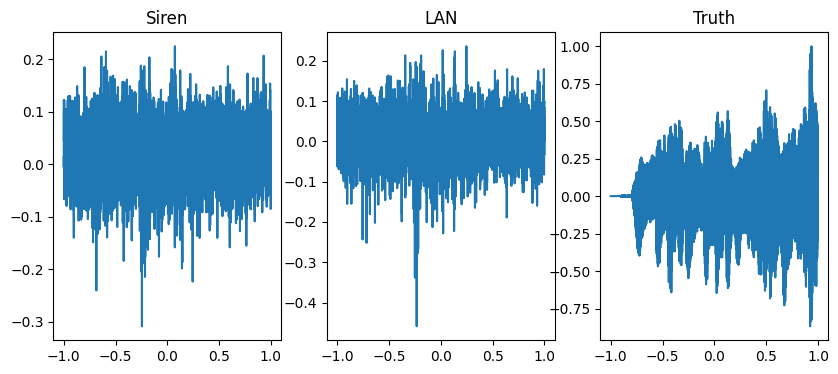

Step 1100, Siren loss 0.032784
Step 1100, LAN loss 0.032353


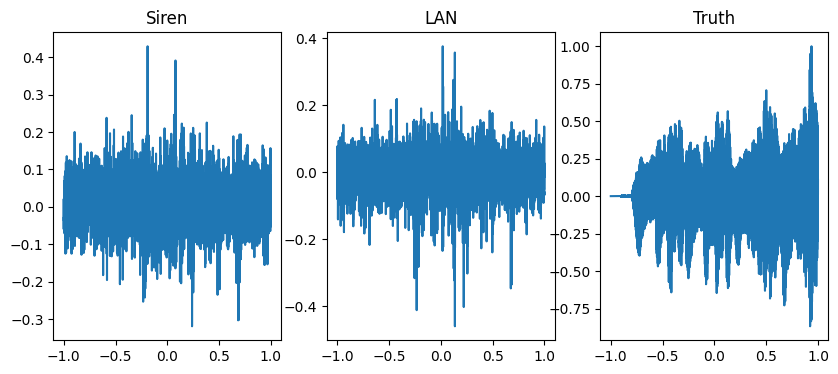

Step 1200, Siren loss 0.008859
Step 1200, LAN loss 0.009301


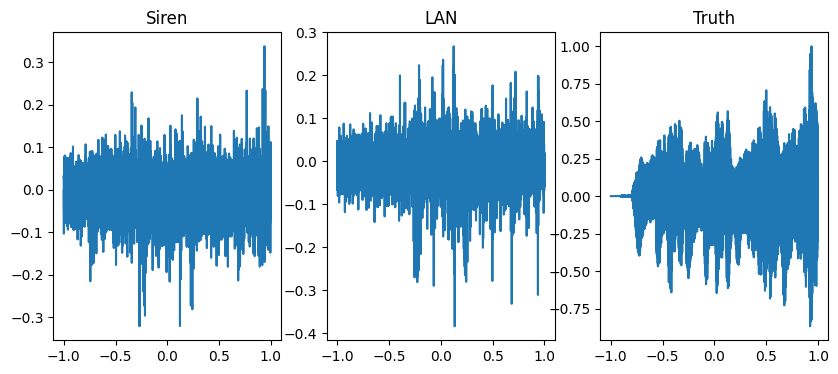

Step 1300, Siren loss 0.017446
Step 1300, LAN loss 0.016609


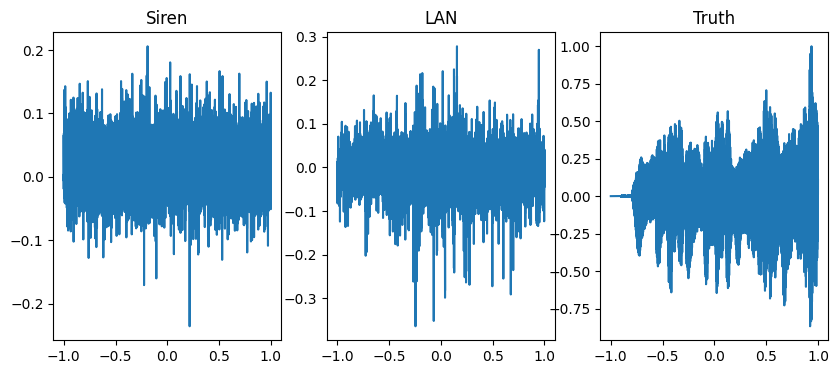

Step 1400, Siren loss 0.029959
Step 1400, LAN loss 0.029131


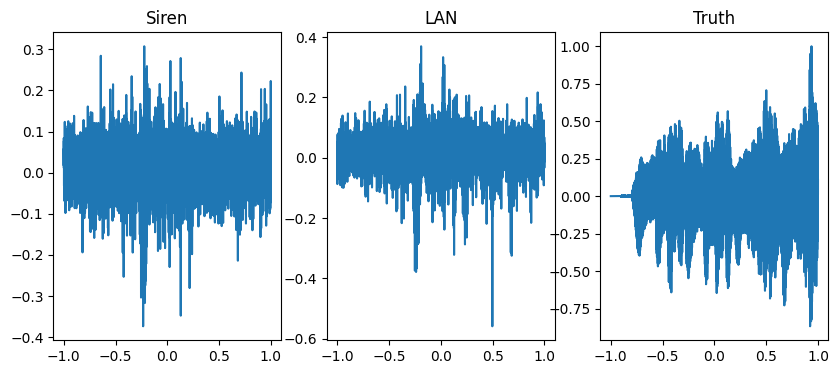

Step 1500, Siren loss 0.083184
Step 1500, LAN loss 0.086565


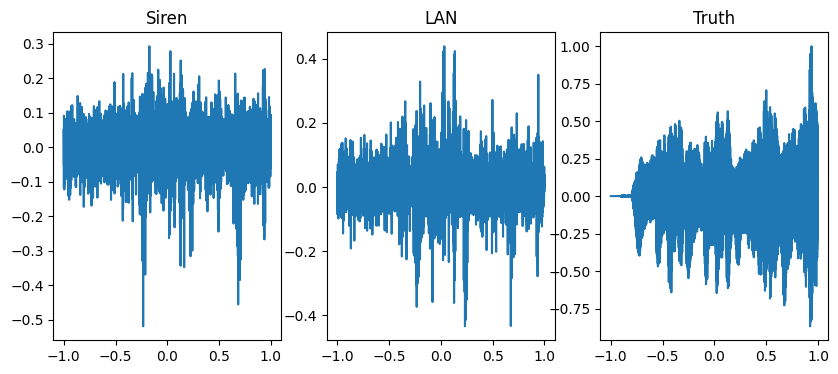

Step 1600, Siren loss 0.015643
Step 1600, LAN loss 0.014291


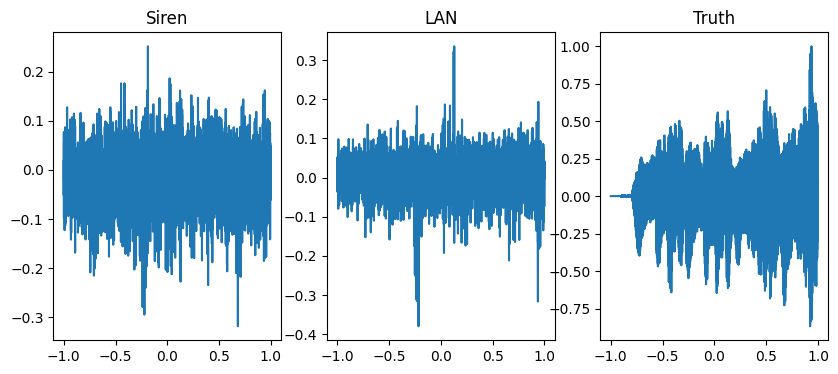

Step 1700, Siren loss 0.022874
Step 1700, LAN loss 0.023897


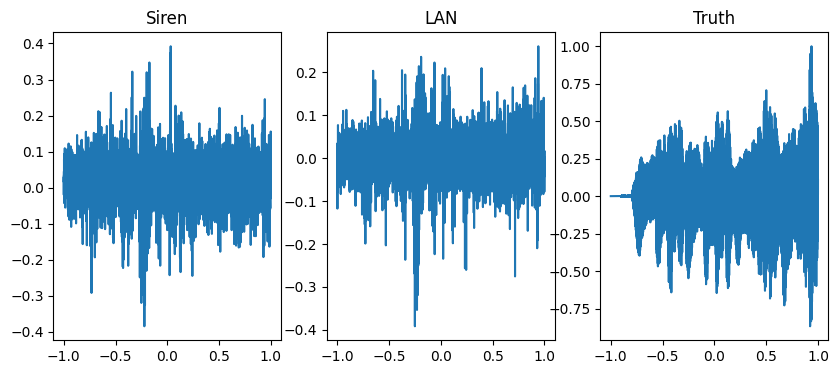

In [ ]:
torch.manual_seed(SEED)
np.random.seed(SEED)

total_steps = 10000
steps_til_summary = 100
batch_size_infer = 4096*4
siren_optim = torch.optim.Adam(lr=1e-4, params=audio_siren.parameters())
lan_optim = torch.optim.Adam(lr=1e-4, params=audio_lan.parameters())

psnr = {
    'Siren': [],
    'LAN': []
}

# model_input, ground_truth = next(iter(dataloader))
# model_input, ground_truth = model_input[0].to(device), ground_truth.to(device)

global_audio_amplitude = bach_audio.amplitude 
# print(global_audio_amplitude.size())

global_audio_timepoints = bach_audio.timepoints
batched_image = global_image_to_batch(global_audio_timepoints, batch_size_infer)

step = 0

while step < total_steps:
    for local_step, [model_input, ground_truth] in enumerate(dataloader):
#         print(local_step)
# for step in range(total_steps):
        audio_siren.train()
        audio_lan.train()    

        model_input, ground_truth = model_input.to(device), ground_truth.to(device)
#         print(model_input.size())

        siren_output = audio_siren(model_input)
        lan_output = audio_lan(model_input)

        siren_loss = ((siren_output - ground_truth)**2).mean()
        lan_loss = ((lan_output - ground_truth)**2).mean()

        siren_optim.zero_grad()
        siren_loss.backward()
        siren_optim.step()

        lan_optim.zero_grad()
        lan_loss.backward()
        lan_optim.step()   

#         step+= 1
        
        if not step % steps_til_summary:
#             audio_siren.eval()
#             audio_lan.eval()
#             print("Step %d, Siren loss %0.6f" % (step, siren_loss))
#             print("Step %d, LAN loss %0.6f" % (step, lan_loss))

#             psnr['Siren'].append(get_psnr(siren_output,  ground_truth))
#             psnr['LAN'].append(get_psnr(lan_output,  ground_truth))

#########################################################################  
#         if not step % steps_til_summary:
            audio_siren.eval()
            audio_lan.eval()
            print("Step %d, Siren loss %0.6f" % (step, siren_loss))
            print("Step %d, LAN loss %0.6f" % (step, lan_loss))

            lan_global_output = []
            siren_global_output = []
            
            for batch in batched_image:
                batch = batch.to(device)

                lan_batched_output = audio_lan(batch)
                siren_batched_output = audio_siren(batch)

                lan_global_output.append(lan_batched_output.cpu().detach().view(-1))
                siren_global_output.append(siren_batched_output.cpu().detach().view(-1))

            lan_global_output = torch.cat(lan_global_output)
            siren_global_output = torch.cat(siren_global_output)   

            psnr['Siren'].append(get_psnr(siren_global_output.detach().cpu(), global_audio_amplitude.detach().cpu()))
            psnr['LAN'].append(get_psnr(lan_global_output.detach().cpu(), global_audio_amplitude.detach().cpu()))
#########################################################################            
            fig, axes = plt.subplots(1, 3, figsize=(10,4))


            axes[0].plot(global_audio_timepoints.detach().cpu().numpy(),siren_global_output.squeeze().detach().cpu().numpy())
            axes[0].set_title('Siren')
            axes[1].plot(global_audio_timepoints.detach().cpu().numpy(),lan_global_output.squeeze().detach().cpu().numpy())
            axes[1].set_title('LAN')
            axes[2].plot(global_audio_timepoints.detach().cpu().numpy(),global_audio_amplitude.squeeze().detach().cpu().numpy())
            axes[2].set_title('Truth')
            plt.show()
#########################################################################              
        step += 1

In [ ]:
plot_loss(psnr, 'PSNR')

In [ ]:
# final_model_output = audio_siren(model_input)
Audio(siren_global_output.squeeze().detach().cpu().numpy(),rate=rate)

In [ ]:
Audio(lan_global_output.squeeze().detach().cpu().numpy(),rate=rate)